# Start pre-processing with Scanpy

## Installation
Following libraries nedds to be installed:
* numpy
* pandas
* scipy
* matplotlib
* scanpy

pip install numpy pandas scipy matplotlib scanpy

In [1]:
#!pip install numpy pandas scipy matplotlib scanpy

In [2]:
from datetime import datetime
start_time = datetime.now()
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=150, dpi_save= 600, facecolor='white', figsize=None,transparent=True, format='png')
sc.settings.figdir ="scanpy/figures_Sc"

scanpy==1.7.2 anndata==0.7.5 umap==0.4.6 numpy==1.20.1 scipy==1.5.2 pandas==1.2.2 scikit-learn==0.24.2 statsmodels==0.12.0 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3


Read each count matrices generated by `cellranger count` for each sample.

In [4]:
SVZ3_root = r"/projects/fs1/mtorbati/Torbati/CellRanger_V6/cellranger_count/SVZ3/SVZ3_count/outs/filtered_feature_bc_matrix"# the directory with the `.mtx` file (feature-barcode matrices)

In [5]:
SVZ14_root = r"/projects/fs1/mtorbati/Torbati/CellRanger_V6/cellranger_count/SVZ14/SVZ14_count/outs/filtered_feature_bc_matrix"# the directory with the `.mtx` file (feature-barcode matrices)

In [6]:
SVZ24_root = r"/projects/fs1/mtorbati/Torbati/CellRanger_V6/cellranger_count/SVZ24/SVZ24_count/outs/filtered_feature_bc_matrix"# the directory with the `.mtx` file (feature-barcode matrices)

In [7]:
OB3_root = r"/projects/fs1/mtorbati/Torbati/CellRanger_V6/cellranger_count/OB3/OB3_count/outs/filtered_feature_bc_matrix"# the directory with the `.mtx` file (feature-barcode matrices)

In [8]:
OB14_root = r"/projects/fs1/mtorbati/Torbati/CellRanger_V6/cellranger_count/OB14/OB14_count/outs/filtered_feature_bc_matrix"# the directory with the `.mtx` file (feature-barcode matrices)

In [9]:
OB24_root = r"/projects/fs1/mtorbati/Torbati/CellRanger_V6/cellranger_count/OB24/OB24_count/outs/filtered_feature_bc_matrix"# the directory with the `.mtx` file (feature-barcode matrices)

In [10]:
DG3_root = r"/projects/fs1/mtorbati/Torbati/CellRanger_V6/cellranger_count/DG3/DG3_count/outs/filtered_feature_bc_matrix"# the directory with the `.mtx` file (feature-barcode matrices)

In [11]:
DG14_root = r"/projects/fs1/mtorbati/Torbati/CellRanger_V6/cellranger_count/DG14/DG14_count/outs/filtered_feature_bc_matrix"# the directory with the `.mtx` file (feature-barcode matrices)

In [12]:
DG24_root = r"/projects/fs1/mtorbati/Torbati/CellRanger_V6/cellranger_count/DG24/DG24_count/outs/filtered_feature_bc_matrix"# the directory with the `.mtx` file (feature-barcode matrices)

loading count matrices as an adata object and attach each sample name in the data, so we can access to all the regions and age groups.

In [13]:
def loadData (mtx_path):
    print ("Reading data ...")
    adata = sc.read_10x_mtx( 
    mtx_path,
    var_names='gene_symbols',# use gene symbols for the variable names (variables-axis index)
    make_unique=True, cache=True)   # write a cache file for faster subsequent reading
    return adata

In [14]:

SVZ3_adata = loadData (SVZ3_root)
SVZ3_adata

... reading from cache file cache/projects-fs1-mtorbati-Torbati-CellRanger_V6-cellranger_count-SVZ3-SVZ3_count-outs-filtered_feature_bc_matrix-matrix.h5ad


Reading data ...


AnnData object with n_obs × n_vars = 865 × 22049
    var: 'gene_ids', 'feature_types'

In [15]:
SVZ3_adata.obs['Sample'] = 'SVZ3'

In [16]:
SVZ3_adata

AnnData object with n_obs × n_vars = 865 × 22049
    obs: 'Sample'
    var: 'gene_ids', 'feature_types'

In [17]:
SVZ14_adata = loadData (SVZ14_root)
SVZ14_adata

... reading from cache file cache/projects-fs1-mtorbati-Torbati-CellRanger_V6-cellranger_count-SVZ14-SVZ14_count-outs-filtered_feature_bc_matrix-matrix.h5ad


Reading data ...


AnnData object with n_obs × n_vars = 1056 × 22049
    var: 'gene_ids', 'feature_types'

In [18]:
SVZ14_adata.obs['Sample'] = 'SVZ14'

In [19]:
SVZ14_adata

AnnData object with n_obs × n_vars = 1056 × 22049
    obs: 'Sample'
    var: 'gene_ids', 'feature_types'

In [20]:
SVZ24_adata = loadData (SVZ24_root)
SVZ24_adata

... reading from cache file cache/projects-fs1-mtorbati-Torbati-CellRanger_V6-cellranger_count-SVZ24-SVZ24_count-outs-filtered_feature_bc_matrix-matrix.h5ad


Reading data ...


AnnData object with n_obs × n_vars = 917 × 22049
    var: 'gene_ids', 'feature_types'

In [21]:
SVZ24_adata.obs['Sample'] = 'SVZ24'

In [22]:
SVZ24_adata

AnnData object with n_obs × n_vars = 917 × 22049
    obs: 'Sample'
    var: 'gene_ids', 'feature_types'

In [23]:
OB3_adata = loadData (OB3_root)
OB3_adata

... reading from cache file cache/projects-fs1-mtorbati-Torbati-CellRanger_V6-cellranger_count-OB3-OB3_count-outs-filtered_feature_bc_matrix-matrix.h5ad


Reading data ...


AnnData object with n_obs × n_vars = 893 × 22049
    var: 'gene_ids', 'feature_types'

In [24]:
OB3_adata.obs['Sample'] = 'OB3'

In [25]:
OB3_adata

AnnData object with n_obs × n_vars = 893 × 22049
    obs: 'Sample'
    var: 'gene_ids', 'feature_types'

In [26]:
OB14_adata = loadData (OB14_root)
OB14_adata

... reading from cache file cache/projects-fs1-mtorbati-Torbati-CellRanger_V6-cellranger_count-OB14-OB14_count-outs-filtered_feature_bc_matrix-matrix.h5ad


Reading data ...


AnnData object with n_obs × n_vars = 1191 × 22049
    var: 'gene_ids', 'feature_types'

In [27]:
OB14_adata.obs['Sample'] = 'OB14'

In [28]:
OB24_adata = loadData (OB24_root)
OB24_adata

... reading from cache file cache/projects-fs1-mtorbati-Torbati-CellRanger_V6-cellranger_count-OB24-OB24_count-outs-filtered_feature_bc_matrix-matrix.h5ad


Reading data ...


AnnData object with n_obs × n_vars = 443 × 22049
    var: 'gene_ids', 'feature_types'

In [29]:
OB24_adata.obs['Sample'] = 'OB24'

In [30]:
OB24_adata

AnnData object with n_obs × n_vars = 443 × 22049
    obs: 'Sample'
    var: 'gene_ids', 'feature_types'

In [31]:
DG3_adata = loadData (DG3_root)
DG3_adata

... reading from cache file cache/projects-fs1-mtorbati-Torbati-CellRanger_V6-cellranger_count-DG3-DG3_count-outs-filtered_feature_bc_matrix-matrix.h5ad


Reading data ...


AnnData object with n_obs × n_vars = 734 × 22049
    var: 'gene_ids', 'feature_types'

In [32]:
DG3_adata.obs['Sample'] = 'DG3'

In [33]:
DG3_adata

AnnData object with n_obs × n_vars = 734 × 22049
    obs: 'Sample'
    var: 'gene_ids', 'feature_types'

In [34]:
DG14_adata = loadData (DG14_root)
DG14_adata

... reading from cache file cache/projects-fs1-mtorbati-Torbati-CellRanger_V6-cellranger_count-DG14-DG14_count-outs-filtered_feature_bc_matrix-matrix.h5ad


Reading data ...


AnnData object with n_obs × n_vars = 864 × 22049
    var: 'gene_ids', 'feature_types'

In [35]:
DG14_adata.obs['Sample'] = 'DG14'

In [36]:
DG14_adata

AnnData object with n_obs × n_vars = 864 × 22049
    obs: 'Sample'
    var: 'gene_ids', 'feature_types'

In [37]:
DG24_adata = loadData (DG24_root)
DG24_adata

... reading from cache file cache/projects-fs1-mtorbati-Torbati-CellRanger_V6-cellranger_count-DG24-DG24_count-outs-filtered_feature_bc_matrix-matrix.h5ad


Reading data ...


AnnData object with n_obs × n_vars = 345 × 22049
    var: 'gene_ids', 'feature_types'

In [38]:
DG24_adata.obs['Sample'] = 'DG24'

In [39]:
DG24_adata

AnnData object with n_obs × n_vars = 345 × 22049
    obs: 'Sample'
    var: 'gene_ids', 'feature_types'

In [40]:
#adding the len of all data define the total number of cell in all samples
len (SVZ3_adata) + len (SVZ14_adata) + len(SVZ24_adata) + len (DG3_adata) + len (DG14_adata) + len (DG24_adata) + len (OB3_adata) + len (OB14_adata) + len (OB24_adata)

7308

In [41]:
#concatenating all samples as on adata
adata_all = DG3_adata.concatenate(SVZ3_adata,OB3_adata, DG14_adata, SVZ14_adata, OB14_adata, DG24_adata, SVZ24_adata, OB24_adata, index_unique=None)

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [42]:
adata_all.obs_names_make_unique()

In [43]:
#n_obs × n_vars --> number of observations (cells) × number of variables (genes)
adata_all

AnnData object with n_obs × n_vars = 7308 × 22049
    obs: 'Sample', 'batch'
    var: 'gene_ids', 'feature_types'

In [44]:
adata_all.obs

,Sample,batch
AAACCTGAGAGACTTA-1,DG3,0
AAACCTGAGTACGTTC-1,DG3,0
AAACCTGCAAACAACA-1,DG3,0
AAACGGGAGGCGATAC-1,DG3,0
AAAGATGCACTAAGTC-1,DG3,0
...,...,...
TTGTAGGAGCGCCTTG-1,OB24,8
TTTGCGCTCTAACTCT-1,OB24,8
TTTGGTTGTCTAGAGG-1,OB24,8
TTTGGTTTCCGGCACA-1,OB24,8


# Create a function for pre-processing the data
* Normalization
* Generate Quality control matrices
* Mictochondrial genes removal
* Doublet removal
* Filter highly variable genes
* Leiden clustering
* Calculate PCA
* Calculate UMAP

In [45]:
#Start pre-proccessing on Scanpy
#create a function to run all the pre-processing steps in scanpy
def pp (adata) :
    #adata = sc.read_10x_mtx (path)
    sc.pp.filter_cells (adata, min_genes=75) #get rid of cells with fewer than 75 genes
    sc.pp.filter_genes (adata, min_cells=1) #get rid of genes that are found in fewer than 1 cells
    adata.var['mt'] = adata.var_names.str.startswith('mt-')# annotate the group of mitochondrial genes as 'mt'
    sc.pp.calculate_qc_metrics (adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
    upper_lim = np.quantile(adata.obs.n_genes_by_counts. values, .98)
    lower_lim = np.quantile(adata.obs.n_genes_by_counts. values, .02)
    adata = adata[(adata.obs.n_genes_by_counts < upper_lim) & (adata.obs.n_genes_by_counts > lower_lim)]
    adata = adata[adata.obs.pct_counts_mt < 5]
    sc.pp.normalize_total(adata, target_sum=1e4) #normalize every cell to 10,000 UMI
    sc.pp.log1p(adata) #change to log counts
    sc.pp.highly_variable_genes (adata, min_mean=0.0125, max_mean=3, min_disp=0.5) #these are default values
    adata.raw = adata #save raw data before processing values and further filtering
    adata = adata[:, adata.var.highly_variable] #filter highly variable
    sc.pp.regress_out (adata, ['total_counts', 'pct_counts_mt']) #Regress out effects of total counts per cell and the
    sc.pp.scale(adata, max_value=10) #scale each gene to unit variance
    sc.tl.pca(adata, svd_solver='arpack' )#calculate PCA
    sc.pp.neighbors (adata, n_neighbors=10, n_pcs=20)
    sc.tl.leiden (adata, resolution = 0.5)
    sc.tl.umap (adata)#calculate the UMAP
    sc.tl.leiden(adata, key_added='clusters', resolution=0.5)#add another obs to adata.obs and name it "clusters" for further cluster annotation.
    return adata

In [46]:
adata_all = pp (adata_all)

filtered out 8 cells that have less than 75 genes expressed
/usr/local/lib/python3.8/dist-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
filtered out 5726 genes that are detected in less than 1 cells
/usr/local/lib/python3.8/dist-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an Ann

In [47]:
adata_all

AnnData object with n_obs × n_vars = 4635 × 2487
    obs: 'Sample', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

# Clustering by `leiden` algorithm

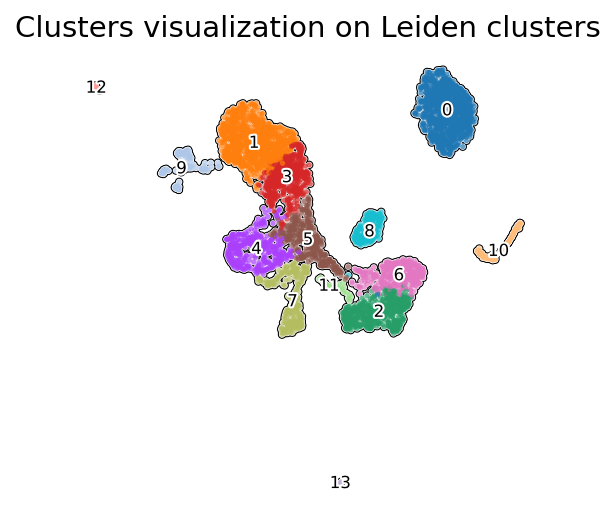

In [48]:
#plot the UMAP
sc.pl.umap(adata_all, color='leiden',add_outline=True, title='Clusters visualization on Leiden clusters',legend_loc='on data'
           , legend_fontoutline=2, legend_fontweight= 'normal',legend_fontsize= 8, outline_width =(0.2, 0.1), frameon=False, save = '_leiden.png')

# Finding marker genes

In [49]:
#create a list of marker genes in order to annotate clusters
marker_genes = ["Dcx", "Igfbpl1", "Ascl1", "Gfap", "Aqp4", "Syt1", "Usp18", "Tfap2c", "Pdgfra", "Mog", "Cx3cr1"]

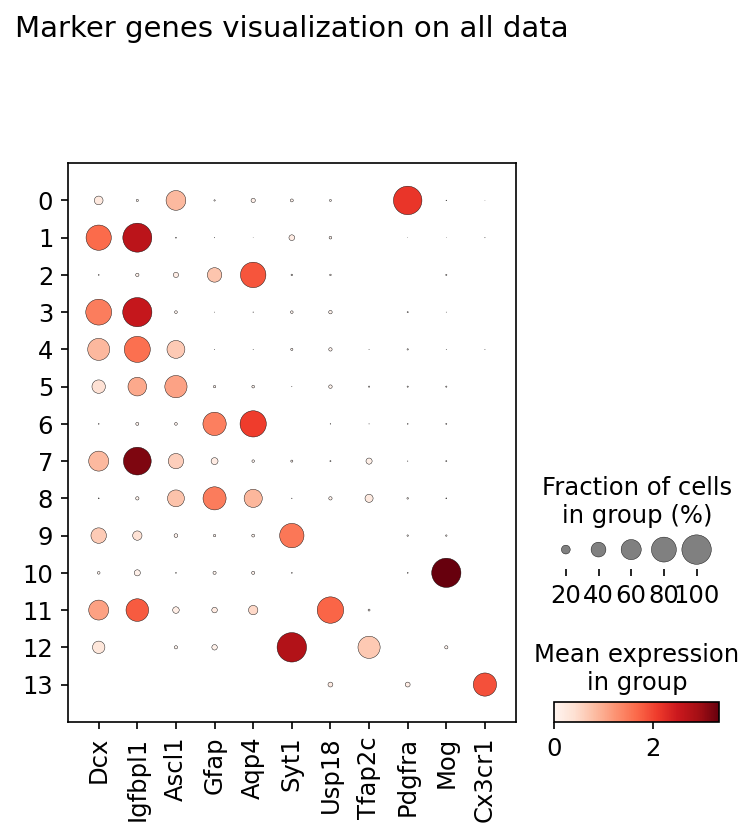

In [50]:
#visualize the marker genes on all dataset in a dotplot
sc.pl.dotplot(adata_all, marker_genes, groupby='leiden', title = "Marker genes visualization on all data", save = 'all_data_MarkerGenes.png')

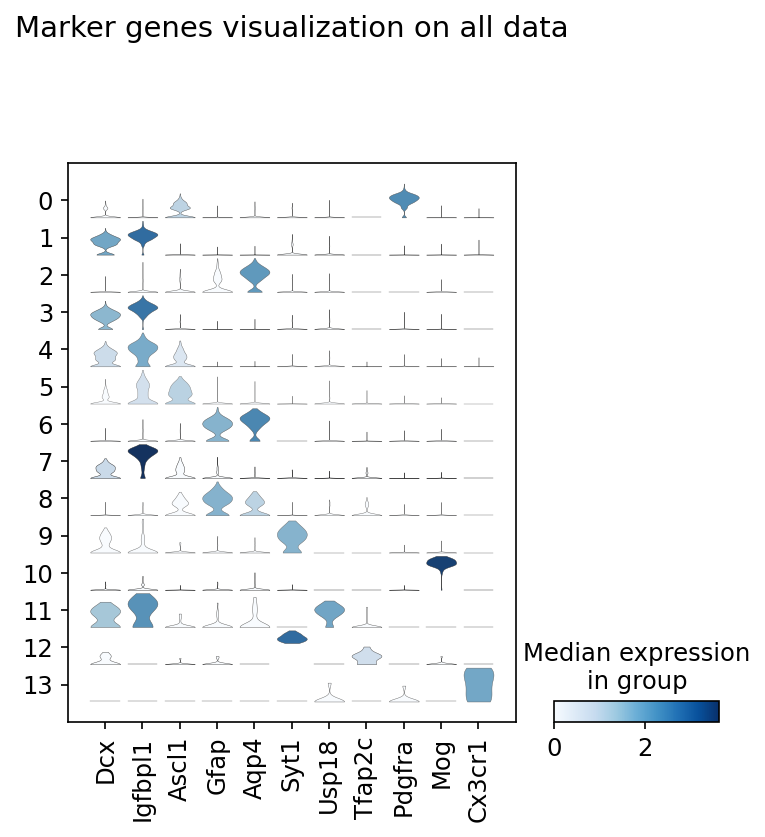

In [51]:
#visualize the marker genes on all dataset in a violin
sc.pl.stacked_violin(adata_all, marker_genes, groupby='leiden', title = "Marker genes visualization on all data", save = 'all_data_violinMarkerGenes.png')

# Cluster annotation based on gene markers

In [52]:
#label the cell types based on marker genes in all adata
new_cluster_names = ['OPCs','Neuroblasts_1', 'Astrocyte like cells_1', 'Neuroblasts_2', ' Immature neuroblast','Mature TAPs', 'Astrocyte like cells_2',
                     'Mature neuroblasts', 'Astrocytes & TAPs', 'Neurons','Mature Oligodendrocytes', 'inflammatory neuroblasts', 'DG NSCs and Neurons','Microglial cells']
adata_all.rename_categories('clusters', new_cluster_names)

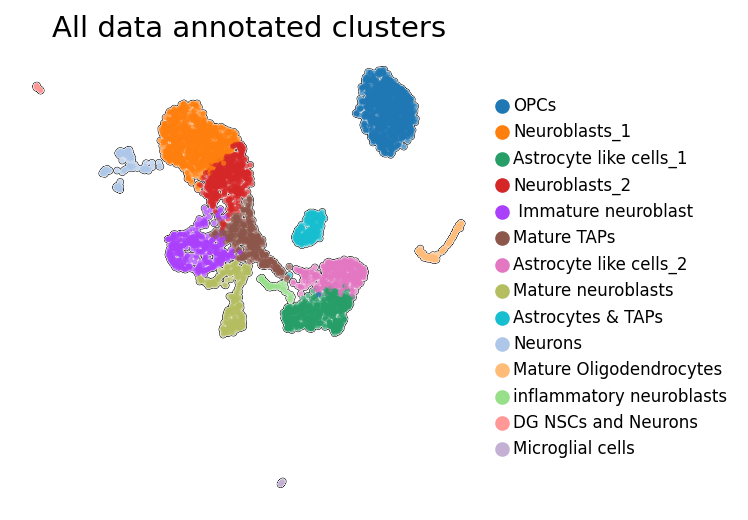

In [53]:
sc.pl.umap(adata_all, color='clusters',add_outline=True,legend_loc='right margin'
           , legend_fontoutline=1.5, legend_fontweight= 'normal',legend_fontsize= 8, outline_width =(0.1, 0.1),
               title='All data annotated clusters', frameon=False, save = 'all_adataAnnotated_leiden.png')

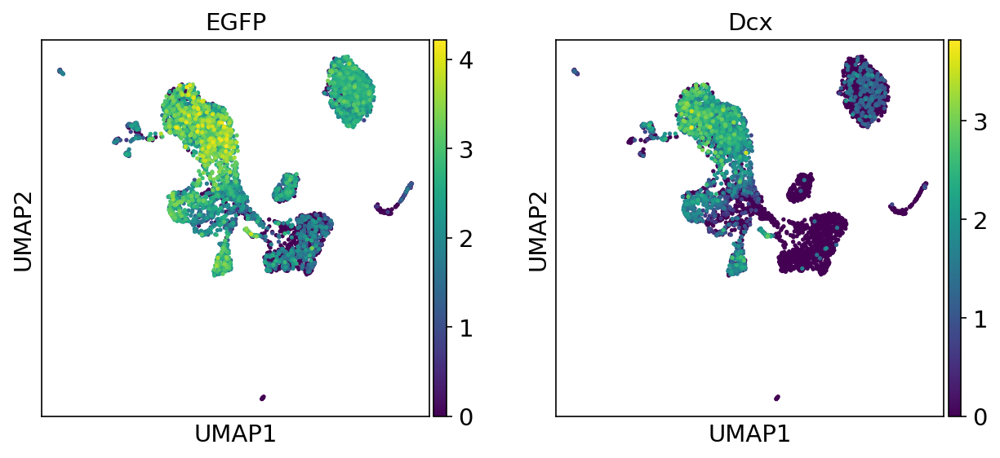

In [54]:
#compare expression pattern between Dcx and EGFP
sc.pl.umap(adata_all, color=["EGFP","Dcx"], save="EGFP_Dcx.png")

# Extracting regions of our intrest:
>we explore SVZ and OB combined together and DG seperately
### we run Velocity analysis on these 6 datasets:
| subventricular zone & Olfactory balb     | Dentate gyrus |
| :---        |    :----:   |
| SVZ_OB3     | DG3       |
| SVZ_OB14  | DG14       |
| SVZ_OB24| DG24

In [55]:
SVZ3_OB3 = adata_all[adata_all.obs['Sample'].isin(['SVZ3', 'OB3'])]

/usr/local/lib/python3.8/dist-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [56]:
SVZ3_OB3

View of AnnData object with n_obs × n_vars = 1195 × 2487
    obs: 'Sample', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'clusters_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [57]:
SVZ3_OB3.obs

,Sample,batch,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,clusters
AAACCTGGTACTTAGC-1,SVZ3,1,3463,3463,9416.0,356.0,3.780799,5,Mature TAPs
AAAGATGAGATGTGGC-1,SVZ3,1,3225,3225,9388.0,201.0,2.141031,5,Mature TAPs
AAAGATGTCATAACCG-1,SVZ3,1,1894,1894,3832.0,102.0,2.661795,1,Neuroblasts_1
AAAGCAAAGAGACTAT-1,SVZ3,1,2620,2620,6772.0,146.0,2.155936,4,Immature neuroblast
AAAGCAATCTGGCGTG-1,SVZ3,1,1752,1752,3403.0,104.0,3.056127,1,Neuroblasts_1
...,...,...,...,...,...,...,...,...,...
TTTATGCCACACATGT-1,OB3,2,3881,3881,11266.0,358.0,3.177703,7,Mature neuroblasts
TTTATGCGTCCATGAT-1,OB3,2,2729,2729,6390.0,152.0,2.378717,8,Astrocytes & TAPs
TTTATGCGTCGGATCC-1,OB3,2,2411,2411,5180.0,158.0,3.050193,7,Mature neuroblasts
TTTGTCAGTCCTGCTT-1,OB3,2,2717,2717,5664.0,180.0,3.177966,8,Astrocytes & TAPs


Trying to set attribute `.uns` of view, copying.


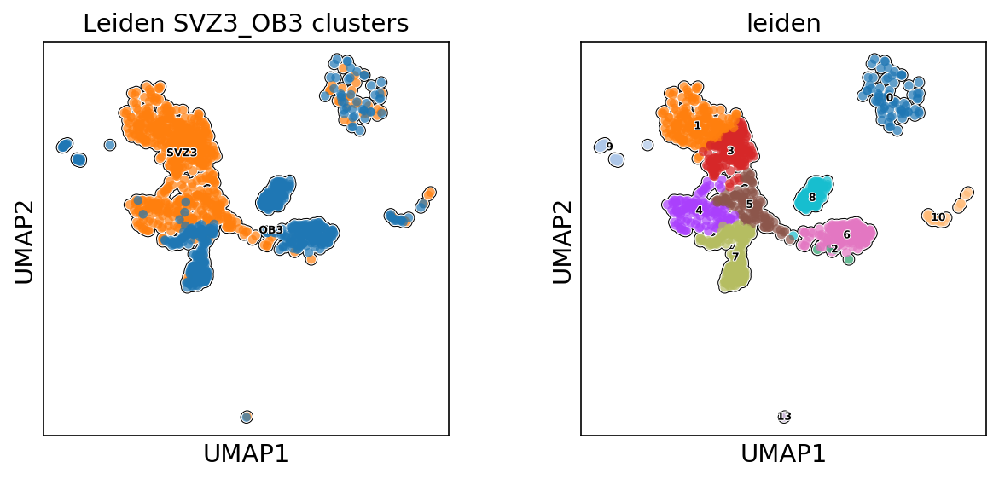

In [58]:
#plot the UMAP
sc.pl.umap(SVZ3_OB3, color=['Sample', 'leiden'], add_outline=True, title='Leiden SVZ3_OB3 clusters',legend_loc='on data', legend_fontsize=6, legend_fontoutline=1, outline_width =(0.1, 0.1))

In [59]:
SVZ14_OB14 = adata_all[adata_all.obs['Sample'].isin(['SVZ14', 'OB14'])]

/usr/local/lib/python3.8/dist-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [60]:
SVZ14_OB14

View of AnnData object with n_obs × n_vars = 1704 × 2487
    obs: 'Sample', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'clusters_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [61]:
SVZ14_OB14.obs

,Sample,batch,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,clusters
AAACGGGAGGGCTCTC-1,SVZ14,4,1581,1581,2974.0,73.0,2.454607,1,Neuroblasts_1
AAACGGGCACTAGTAC-1,SVZ14,4,1766,1766,3696.0,123.0,3.327922,3,Neuroblasts_2
AAAGATGGTCAATACC-1,SVZ14,4,3196,3196,9287.0,286.0,3.079574,5,Mature TAPs
AAAGATGGTCTGCCAG-1,SVZ14,4,2614,2614,4925.0,131.0,2.659899,0,OPCs
AAAGTAGTCCGTCATC-1,SVZ14,4,2755,2755,7615.0,132.0,1.733421,4,Immature neuroblast
...,...,...,...,...,...,...,...,...,...
TTTGGTTGTATGCTTG-1,OB14,5,2732,2732,5041.0,136.0,2.697877,0,OPCs
TTTGGTTTCATTGCCC-1,OB14,5,2450,2450,4324.0,107.0,2.474560,0,OPCs
TTTGTCAGTACAGACG-1,OB14,5,2649,2649,4971.0,151.0,3.037618,0,OPCs
TTTGTCAGTATCACCA-1,OB14,5,2229,2229,3494.0,89.0,2.547224,0,OPCs


Trying to set attribute `.uns` of view, copying.


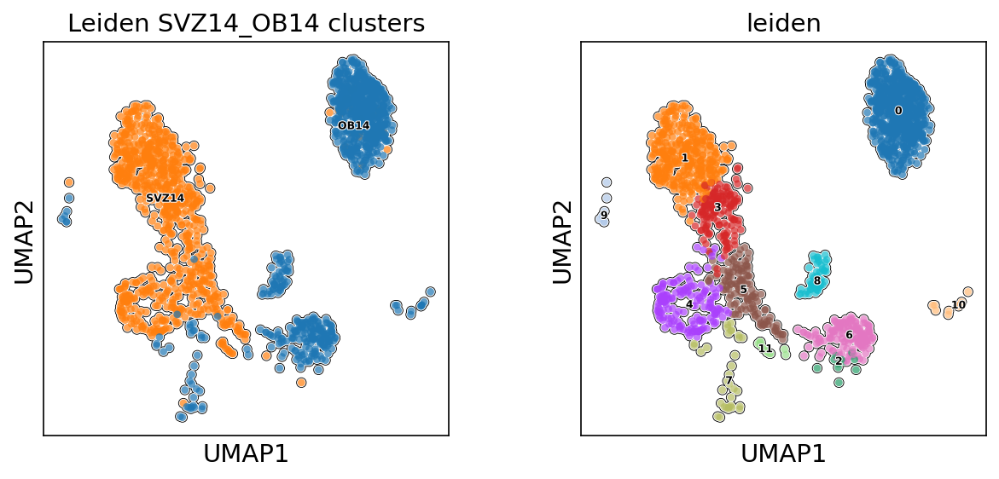

In [62]:
#plot the UMAP
sc.pl.umap(SVZ14_OB14, color=['Sample','leiden'], add_outline=True, title='Leiden SVZ14_OB14 clusters',legend_loc='on data', legend_fontsize=6, legend_fontoutline=1, outline_width =(0.1, 0.1))

In [63]:
SVZ24_OB24 = adata_all[adata_all.obs['Sample'].isin(['SVZ24', 'OB24'])]

/usr/local/lib/python3.8/dist-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [64]:
SVZ24_OB24

View of AnnData object with n_obs × n_vars = 784 × 2487
    obs: 'Sample', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'clusters_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [65]:
SVZ24_OB24.obs

,Sample,batch,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,clusters
AAACCTGCACGAAATA-1,SVZ24,7,2740,2740,8805.0,249.0,2.827939,5,Mature TAPs
AAACCTGCATTGGCGC-1,SVZ24,7,3714,3714,12113.0,346.0,2.856435,4,Immature neuroblast
AAACGGGGTAGGACAC-1,SVZ24,7,3338,3338,9176.0,180.0,1.961639,5,Mature TAPs
AAACGGGTCTACTATC-1,SVZ24,7,2420,2420,5493.0,177.0,3.222283,1,Neuroblasts_1
AAAGATGTCTCTTATG-1,SVZ24,7,2731,2731,6771.0,326.0,4.814651,5,Mature TAPs
...,...,...,...,...,...,...,...,...,...
TTGGAACTCTACCAGA-1,OB24,8,1468,1468,2447.0,48.0,1.961586,9,Neurons
TTGGCAATCTGTACGA-1,OB24,8,2007,2007,3942.0,99.0,2.511415,3,Neuroblasts_2
TTGTAGGAGCGCCTTG-1,OB24,8,1180,1180,2226.0,101.0,4.537287,2,Astrocyte like cells_1
TTTGGTTTCCGGCACA-1,OB24,8,1251,1251,2209.0,62.0,2.806700,2,Astrocyte like cells_1


Trying to set attribute `.uns` of view, copying.


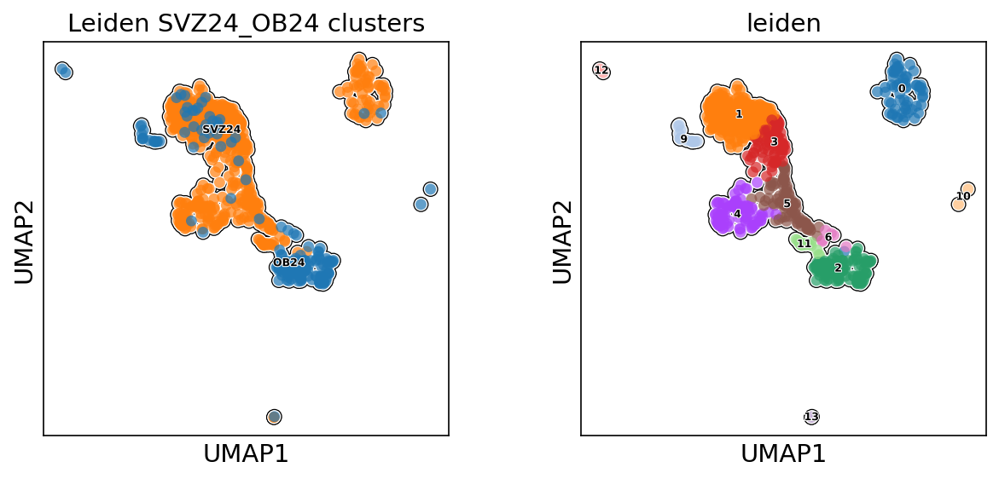

In [66]:
#plot the UMAP
sc.pl.umap(SVZ24_OB24, color=['Sample','leiden'],add_outline=True, title='Leiden SVZ24_OB24 clusters',legend_loc='on data', legend_fontsize=6, legend_fontoutline=1, outline_width =(0.1, 0.1))

In [67]:
DG3 = adata_all[adata_all.obs['Sample'].isin(['DG3'])]

/usr/local/lib/python3.8/dist-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [68]:
DG3

View of AnnData object with n_obs × n_vars = 327 × 2487
    obs: 'Sample', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'clusters_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [69]:
DG3.obs

,Sample,batch,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,clusters
AAACCTGAGAGACTTA-1,DG3,0,3295,3295,7070.0,163.0,2.305516,0,OPCs
AAACCTGAGTACGTTC-1,DG3,0,2110,2110,4286.0,157.0,3.663089,2,Astrocyte like cells_1
AAACGGGAGGCGATAC-1,DG3,0,3561,3561,13790.0,309.0,2.240754,10,Mature Oligodendrocytes
AAATGCCAGCACAGGT-1,DG3,0,1958,1958,3947.0,186.0,4.712440,2,Astrocyte like cells_1
AACCGCGGTCCAACTA-1,DG3,0,1885,1885,4016.0,98.0,2.440239,3,Neuroblasts_2
...,...,...,...,...,...,...,...,...,...
TTTATGCTCACCACCT-1,DG3,0,2546,2546,4986.0,132.0,2.647413,0,OPCs
TTTGCGCGTACAGCAG-1,DG3,0,1158,1158,1785.0,89.0,4.985994,1,Neuroblasts_1
TTTGGTTAGTTAAGTG-1,DG3,0,2151,2151,5691.0,110.0,1.932877,10,Mature Oligodendrocytes
TTTGGTTGTGCCTGCA-1,DG3,0,1973,1973,4331.0,124.0,2.863080,1,Neuroblasts_1


Trying to set attribute `.uns` of view, copying.


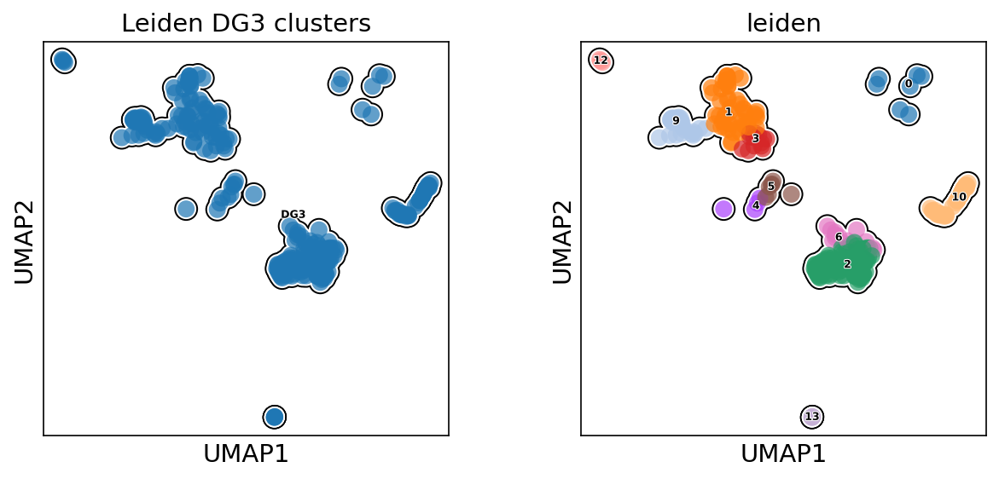

In [70]:
#plot the UMAP
sc.pl.umap(DG3, color=['Sample','leiden'],add_outline=True, title='Leiden DG3 clusters',legend_loc='on data', legend_fontsize=6, legend_fontoutline=1, outline_width =(0.1, 0.1))

In [71]:
DG14 = adata_all[adata_all.obs['Sample'].isin(['DG14'])]

/usr/local/lib/python3.8/dist-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [72]:
DG14

View of AnnData object with n_obs × n_vars = 384 × 2487
    obs: 'Sample', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'clusters_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [73]:
DG14.obs

,Sample,batch,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,clusters
AAACCTGGTAGCGTGA-1,DG14,3,972,972,1543.0,77.0,4.990279,11,inflammatory neuroblasts
AAACGGGAGCGCTTAT-1,DG14,3,1049,1049,1675.0,26.0,1.552239,1,Neuroblasts_1
AAAGCAAAGTGGTCCC-1,DG14,3,2231,2231,4023.0,84.0,2.087994,9,Neurons
AAAGCAAGTAGCTCCG-1,DG14,3,2737,2737,7759.0,268.0,3.454053,10,Mature Oligodendrocytes
AACCGCGGTCAGTGGA-1,DG14,3,2513,2513,5984.0,214.0,3.576203,4,Immature neuroblast
...,...,...,...,...,...,...,...,...,...
TTTATGCTCTTATCTG-1,DG14,3,1040,1040,1698.0,81.0,4.770318,2,Astrocyte like cells_1
TTTGGTTAGACTAGAT-1,DG14,3,2074,2074,4843.0,185.0,3.819946,2,Astrocyte like cells_1
TTTGGTTAGATCGATA-1,DG14,3,1243,1243,2264.0,82.0,3.621908,2,Astrocyte like cells_1
TTTGTCAAGTGGAGTC-1,DG14,3,1264,1264,2632.0,128.0,4.863222,2,Astrocyte like cells_1


Trying to set attribute `.uns` of view, copying.


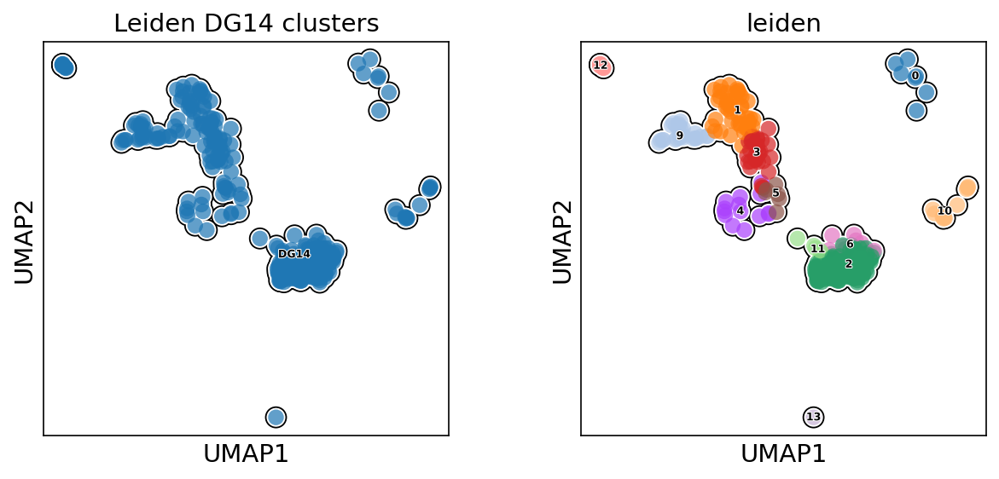

In [74]:
#plot the UMAP
sc.pl.umap(DG14, color=['Sample','leiden'],add_outline=True, title='Leiden DG14 clusters',legend_loc='on data', legend_fontsize=6, legend_fontoutline=1, outline_width =(0.1, 0.1))

In [75]:
DG24 = adata_all[adata_all.obs['Sample'].isin(['DG24'])]

/usr/local/lib/python3.8/dist-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [76]:
DG24

View of AnnData object with n_obs × n_vars = 241 × 2487
    obs: 'Sample', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'clusters_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [77]:
DG24.obs

,Sample,batch,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,clusters
AAACCTGGTAAGGATT-1,DG24,6,2346,2346,5357.0,195.0,3.640097,8,Astrocytes & TAPs
AAACGGGAGAGCTGGT-1,DG24,6,1554,1554,3247.0,146.0,4.496458,8,Astrocytes & TAPs
AAACGGGGTACGACCC-1,DG24,6,3016,3016,6120.0,202.0,3.300654,0,OPCs
AAAGATGGTGAGCGAT-1,DG24,6,2449,2449,4359.0,114.0,2.615279,0,OPCs
AAAGCAATCCCATTTA-1,DG24,6,2646,2646,4832.0,145.0,3.000828,0,OPCs
...,...,...,...,...,...,...,...,...,...
TTGACTTCACTTCGAA-1,DG24,6,2077,2077,3421.0,94.0,2.747735,0,OPCs
TTGGCAACATATACGC-1,DG24,6,3188,3188,6159.0,153.0,2.484169,0,OPCs
TTTCCTCCATTGCGGC-1,DG24,6,2951,2951,5742.0,253.0,4.406130,0,OPCs
TTTGGTTCATCCGTGG-1,DG24,6,1413,1413,2686.0,77.0,2.866716,8,Astrocytes & TAPs


Trying to set attribute `.uns` of view, copying.


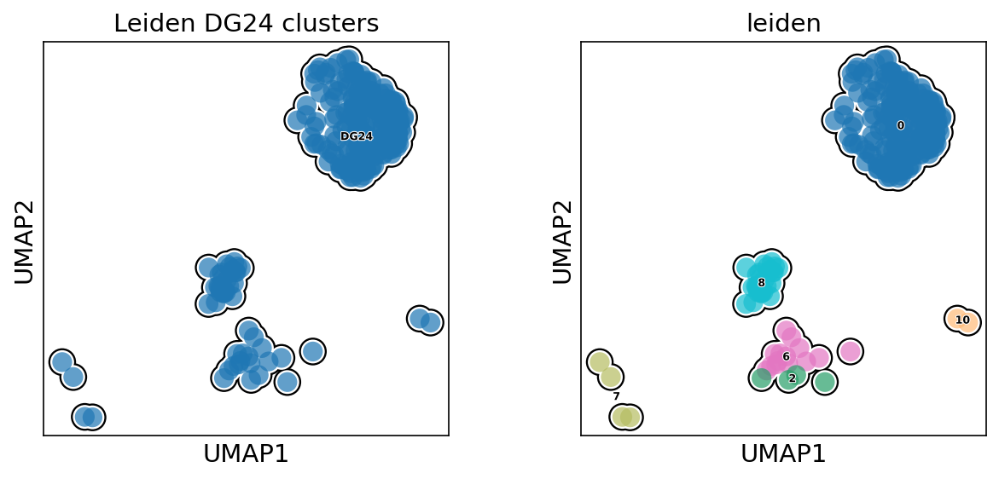

In [78]:
#plot the UMAP
sc.pl.umap(DG24, color=['Sample','leiden'],add_outline=True, title='Leiden DG24 clusters',legend_loc='on data', legend_fontsize=6, legend_fontoutline=1, outline_width =(0.1, 0.1))

# Start velocity analysis with ScVelo

## Install scvelo
pip install git+https://github.com/theislab/scvelo.git

In [79]:
import scvelo as scv

In [80]:
scv.logging.print_version()
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params(style='scvelo', dpi=150, dpi_save=600, frameon=None, vector_friendly=True, transparent=True, figsize=None, color_map=None, facecolor=None, format='png', ipython_format='png2x')  # for beautified visualization

Running scvelo 0.2.4 (python 3.8.5) on 2023-01-16 13:25.


In [81]:
DG3

AnnData object with n_obs × n_vars = 327 × 2487
    obs: 'Sample', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'clusters_colors', 'Sample_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

# load loom files for spliced/unspliced matrices for each sample:

In [82]:
DG3_ldata = scv.read('/projects/fs1/mtorbati/Torbati/CellRanger_V6/cellranger_count/DG3/DG3_count/velocyto/DG3_count.loom', cache=True)

... reading from cache file cache/projects-fs1-mtorbati-Torbati-CellRanger_V6-cellranger_count-DG3-DG3_count-velocyto-DG3_count.h5ad
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [83]:
DG3_ldata.var_names_make_unique()

In [84]:
#merge adata and ldata together make adata --> normalized with RNA includes 'spliced' and 'unspliced' regions
#LA in variable names is for ldata and adata combined
DG3_LA = scv.utils.merge(DG3_ldata, DG3)

In [85]:
DG3_LA

AnnData object with n_obs × n_vars = 327 × 2391
    obs: 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'Sample', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'clusters_colors', 'Sample_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

## proportions of spliced and unspliced for each cluster

In [86]:
DG3_LA = DG3_LA[~DG3_LA.obs['clusters'].isin(['OPCs','Microglial cells','Mature Oligodendrocytes']),:]

saving figure to file ./figures/scvelo_proportions_DG3_S_U.png


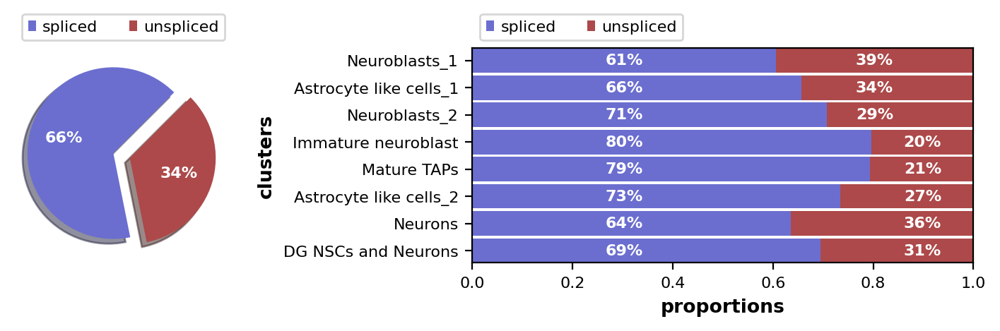

In [87]:
scv.pl.proportions(DG3_LA,groupby='clusters', save='DG3_S_U.png')

In [88]:
### calculate the moments
scv.pp.moments(DG3_LA)

Normalized count data: X, spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [89]:
#calculate the velocity with defalt value (stochastic method)
scv.tl.velocity(DG3_LA)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [90]:
#compute the velocity graph
scv.tl.velocity_graph(DG3_LA)

computing velocity graph (using 1/40 cores)


  0%|          | 0/267 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [91]:
DG3_LA

AnnData object with n_obs × n_vars = 267 × 2391
    obs: 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'Sample', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters', 'n_counts', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'clusters_colors', 'Sample_colors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'distances', 'connecti

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


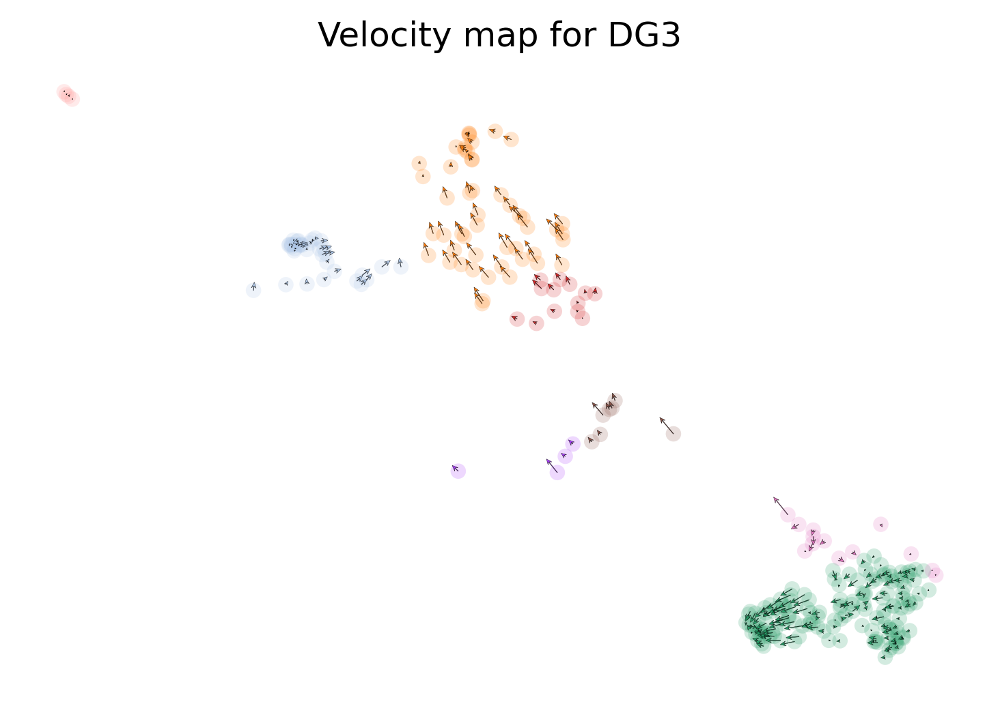

In [92]:
#get one velocity arrow for each individual cell
scv.pl.velocity_embedding(DG3_LA, basis = "umap", color="clusters", title='Velocity map for DG3')

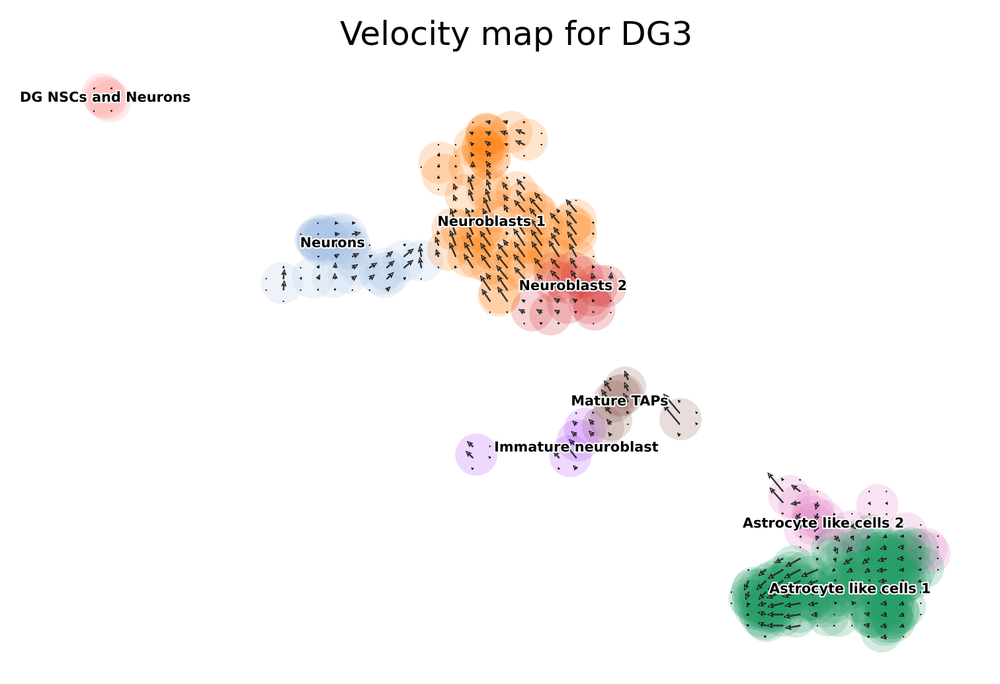

In [93]:
scv.pl.velocity_embedding_grid(DG3_LA, basis = "umap", color="clusters", title='Velocity map for DG3', legend_loc= "on data", legend_fontsize= 5)

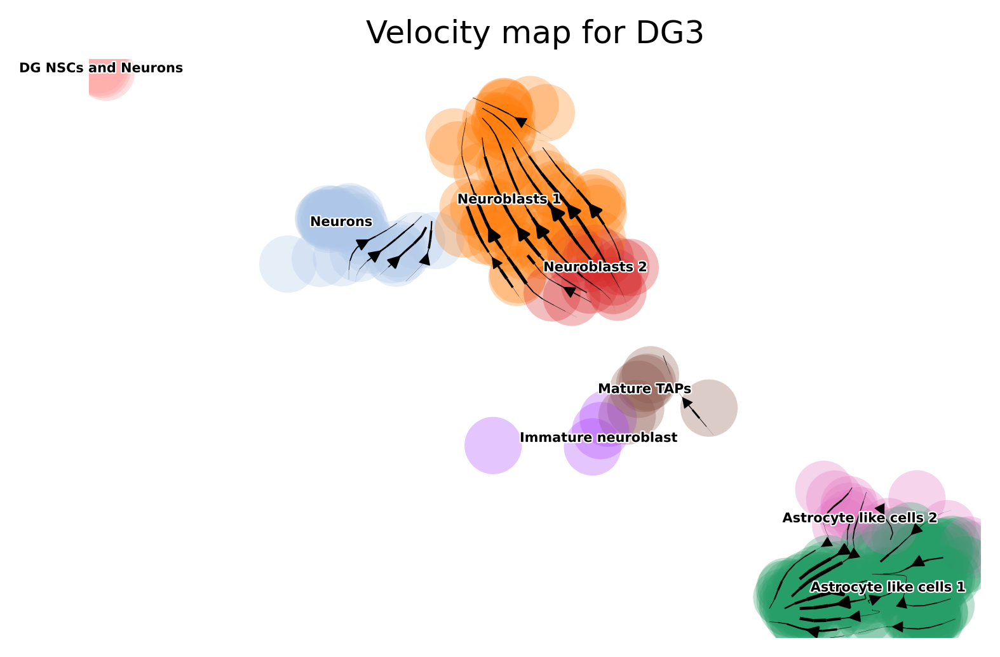

In [94]:
scv.pl.velocity_embedding_stream(DG3_LA, basis = "umap", color="clusters", title='Velocity map for DG3', legend_loc= "on data", legend_fontsize= 5)

In [95]:
DG3_LA

AnnData object with n_obs × n_vars = 267 × 2391
    obs: 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'Sample', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters', 'n_counts', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'clusters_colors', 'Sample_colors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'dist

In [96]:
#calculate  dynamic model
scv.tl.recover_dynamics(DG3_LA, n_jobs= 20)
scv.tl.velocity(DG3_LA, mode= "dynamical")
scv.tl.velocity_graph(DG3_LA)

recovering dynamics (using 20/40 cores)


  0%|          | 0/828 [00:00<?, ?gene/s]

    finished (0:01:57) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/40 cores)


  0%|          | 0/267 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_DG3_dynamic.png


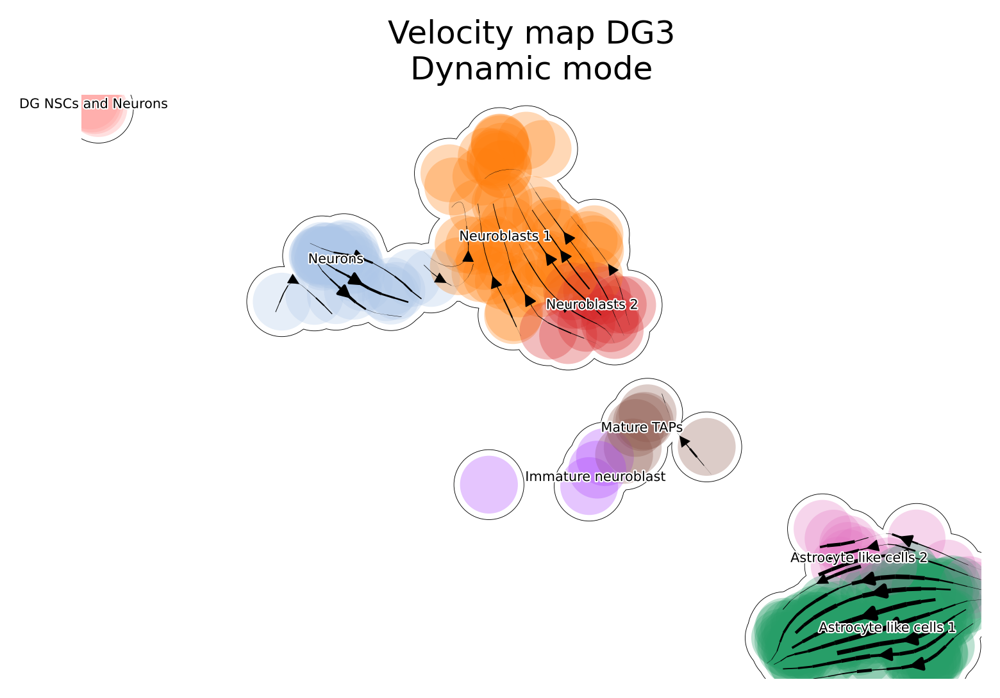

In [97]:
scv.pl.velocity_embedding_stream(DG3_LA, basis= "umap", color= "clusters", title='Velocity map DG3\nDynamic mode', legend_loc='on data',legend_fontoutline=1, legend_fontweight= 'normal',legend_fontsize= 5, 
           add_outline=True, outline_width =(0.01, 0.1), save='DG3_dynamic.png')

computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    94 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    188 total control genes are used. (0:00:00)


calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)
saving figure to file ./figures/scvelo_DG3_CellCycle.png


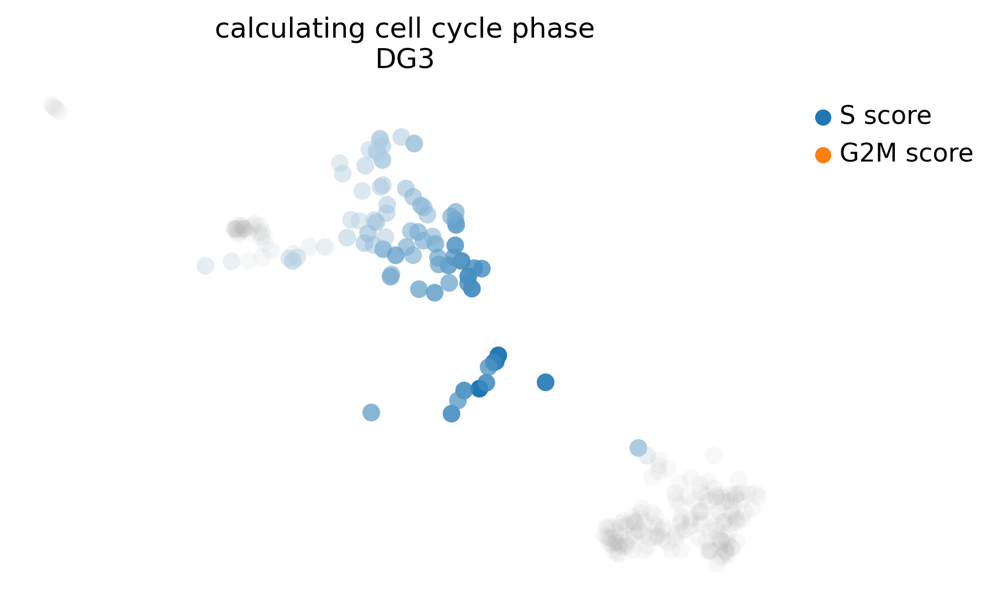

In [98]:
#Calculates scores and assigns a cell cycle phase (G1, S, G2M) using the list of cell cycle genes
scv.tl.score_genes_cell_cycle(DG3_LA)
scv.pl.scatter(DG3_LA, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95], title= "calculating cell cycle phase\nDG3", save='DG3_CellCycle.png')

In [99]:
DG14_ldata = scv.read('/projects/fs1/mtorbati/Torbati/CellRanger_V6/cellranger_count/DG14/DG14_count/velocyto/DG14_count.loom', cache=True)

... reading from cache file cache/projects-fs1-mtorbati-Torbati-CellRanger_V6-cellranger_count-DG14-DG14_count-velocyto-DG14_count.h5ad
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [100]:
DG14_ldata.var_names_make_unique()

In [101]:
#merge adata and ldata together make adata --> normalized with RNA includes 'spliced' and 'unspliced' regions
#LA in variable names is for ldata and adata combined
DG14_LA = scv.utils.merge(DG14_ldata, DG14)

In [102]:
DG14_LA

AnnData object with n_obs × n_vars = 384 × 2391
    obs: 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'Sample', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters', 'sample_batch'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'clusters_colors', 'Sample_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [103]:
DG14_LA = DG14_LA[~DG14_LA.obs['clusters'].isin(['OPCs','Microglial cells','Mature Oligodendrocytes']),:]

saving figure to file ./figures/scvelo_proportions_DG14_S_U.png


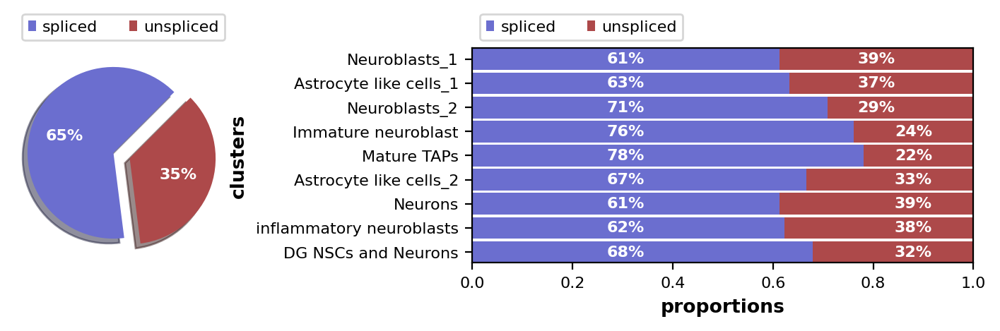

In [104]:
scv.pl.proportions(DG14_LA, groupby='clusters',save='DG14_S_U.png')

In [105]:
#calculate the moments
scv.pp.moments(DG14_LA)

Normalized count data: X, spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [106]:
#calculate the velocity with defalt value (stochastic method)
scv.tl.velocity(DG14_LA)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [107]:
#compute the velocity graph
scv.tl.velocity_graph(DG14_LA)

computing velocity graph (using 1/40 cores)


  0%|          | 0/364 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


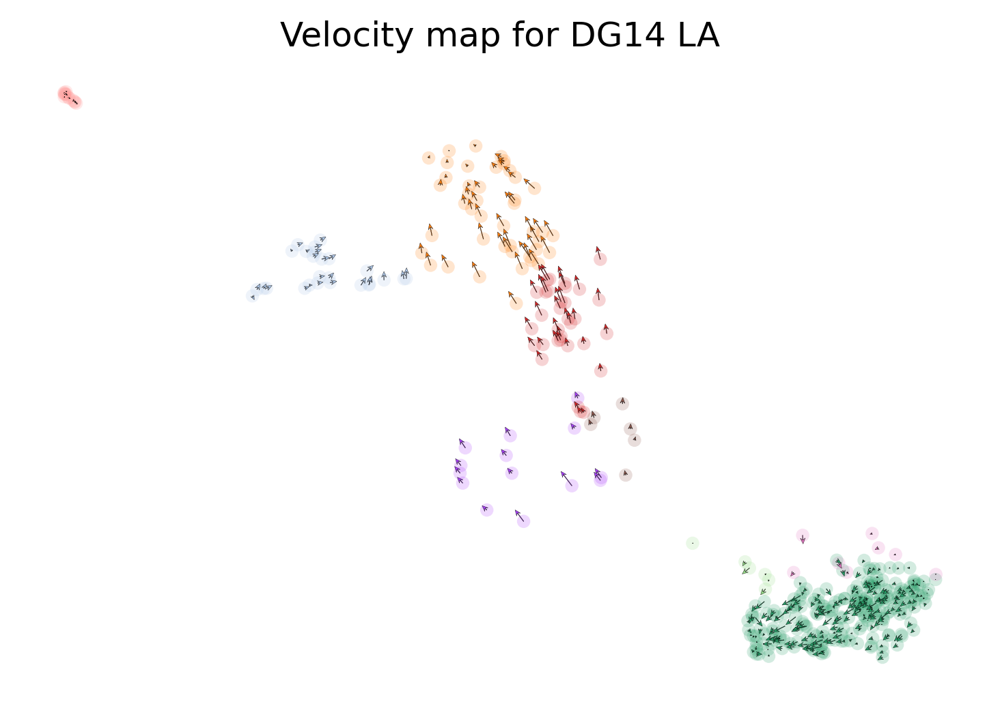

In [108]:
#get one velocity arrow for each individual cell
scv.pl.velocity_embedding(DG14_LA, basis = "umap", color="clusters", title='Velocity map for DG14_LA')

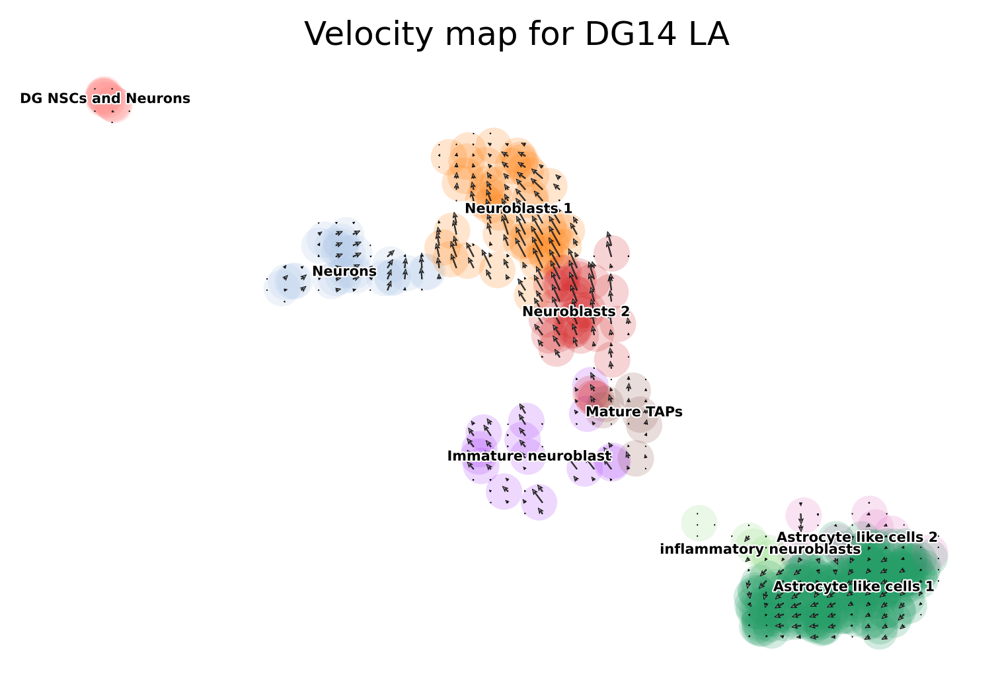

In [109]:
scv.pl.velocity_embedding_grid(DG14_LA, basis = "umap", color="clusters", title='Velocity map for DG14_LA', legend_loc= "on data", legend_fontsize= 5)

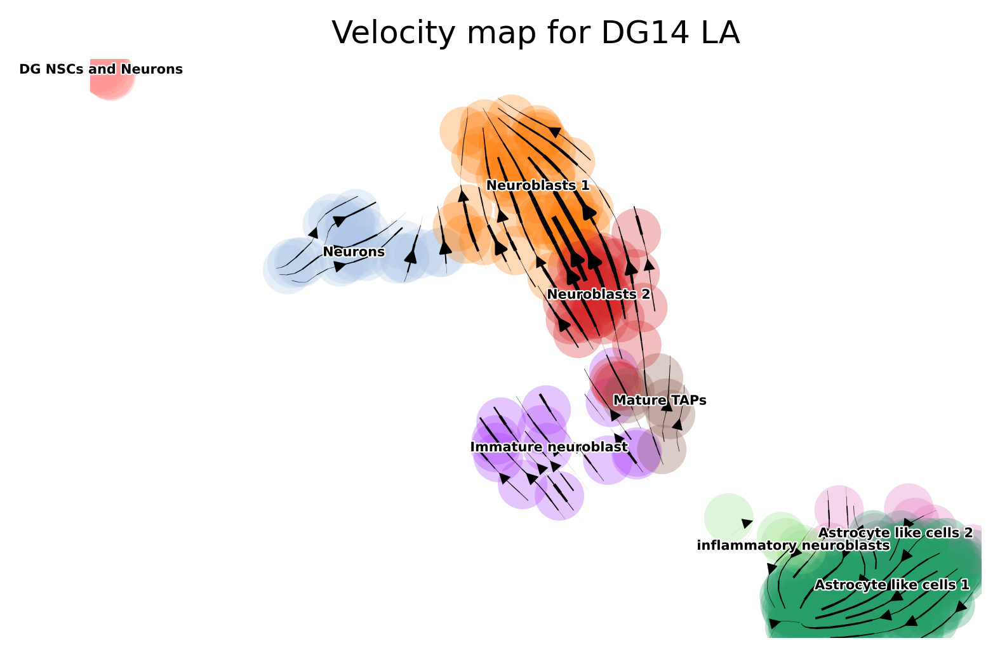

In [110]:
scv.pl.velocity_embedding_stream(DG14_LA, basis = "umap", color="clusters", title='Velocity map for DG14_LA', legend_loc= "on data", legend_fontsize= 5)

In [111]:
DG14_LA

AnnData object with n_obs × n_vars = 364 × 2391
    obs: 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'Sample', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters', 'sample_batch', 'n_counts', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'clusters_colors', 'Sample_colors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'

In [112]:
#calculate  dynamic model
scv.tl.recover_dynamics(DG14_LA, n_jobs= 20)
scv.tl.velocity(DG14_LA, mode= "dynamical")
scv.tl.velocity_graph(DG14_LA)

recovering dynamics (using 20/40 cores)


  0%|          | 0/854 [00:00<?, ?gene/s]

    finished (0:01:30) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/40 cores)


  0%|          | 0/364 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_DG14_dynamic.png


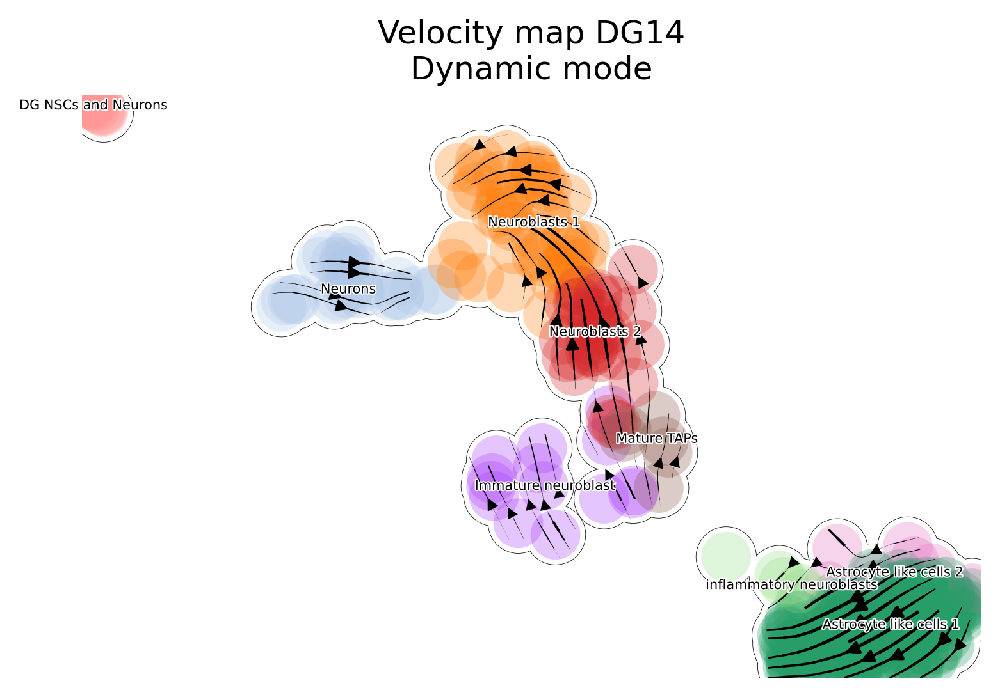

In [113]:
scv.pl.velocity_embedding_stream(DG14_LA, basis= "umap", color= "clusters", title='Velocity map DG14\nDynamic mode', legend_loc='on data',legend_fontoutline=1, legend_fontweight= 'normal',legend_fontsize= 5, 
           add_outline=True, outline_width =(0.01, 0.1), save='DG14_dynamic.png')

computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    106 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    225 total control genes are used. (0:00:00)


calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)
saving figure to file ./figures/scvelo_DG14_CellCeycle.png


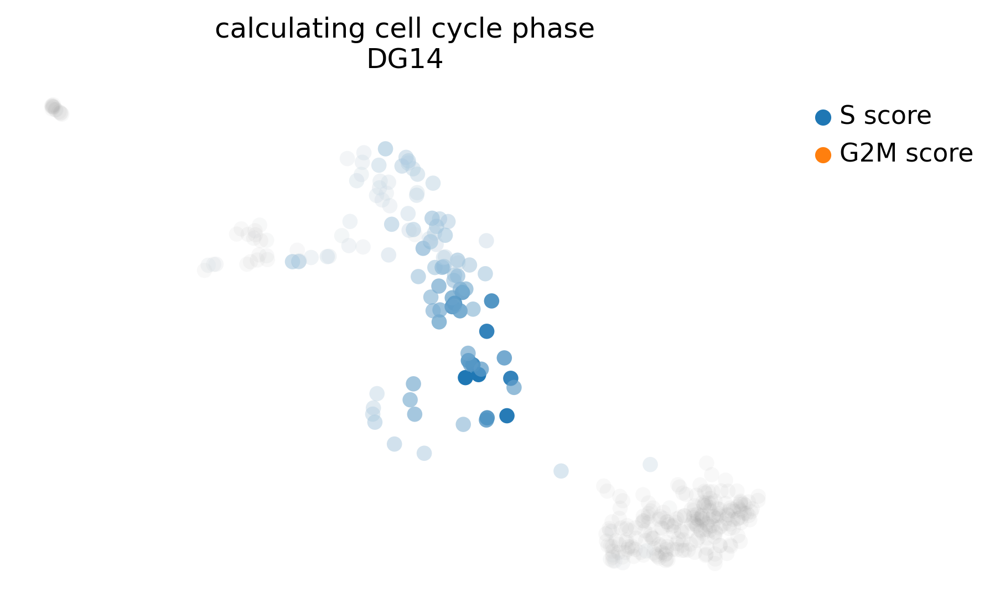

In [114]:
#Calculates scores and assigns a cell cycle phase (G1, S, G2M) using the list of cell cycle genes
scv.tl.score_genes_cell_cycle(DG14_LA)
scv.pl.scatter(DG14_LA, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95], title= "calculating cell cycle phase\nDG14", save='DG14_CellCeycle.png')

In [115]:
DG24_ldata = scv.read('/projects/fs1/mtorbati/Torbati/CellRanger_V6/cellranger_count/DG24/DG24_count/velocyto/DG24_count.loom', cache=True)

... reading from cache file cache/projects-fs1-mtorbati-Torbati-CellRanger_V6-cellranger_count-DG24-DG24_count-velocyto-DG24_count.h5ad
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [116]:
DG24_ldata.var_names_make_unique()

In [117]:
#merge adata and ldata together make adata --> normalized with RNA includes 'spliced' and 'unspliced' regions
#LA in variable names is for ldata and adata combined
DG24_LA = scv.utils.merge(DG24_ldata, DG24)

In [118]:
DG24_LA

AnnData object with n_obs × n_vars = 241 × 2391
    obs: 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'Sample', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters', 'sample_batch'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'clusters_colors', 'Sample_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [119]:
DG24_LA = DG24_LA[~DG24_LA.obs['clusters'].isin(['Mature Oligodendrocytes', 'OPCs']),:]

saving figure to file ./figures/scvelo_proportions_DG24_S_U.png


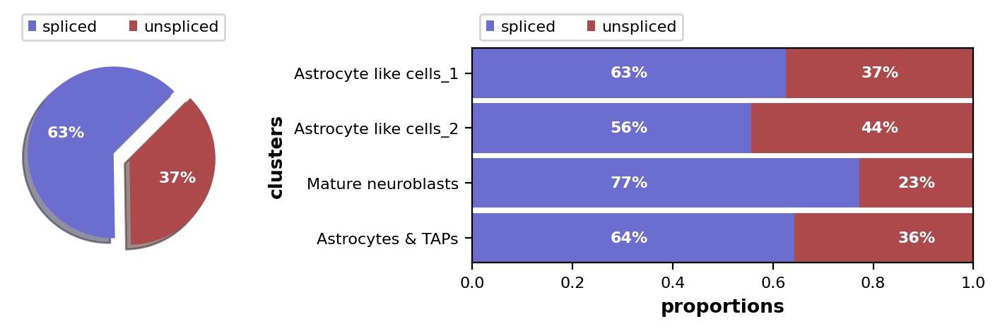

In [120]:
scv.pl.proportions(DG24_LA, groupby='clusters',save='DG24_S_U.png')

In [121]:
#calculate the moments
scv.pp.moments(DG24_LA)

Normalized count data: X, spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [122]:
#calculate the velocity with defalt value (stochastic method)
scv.tl.velocity(DG24_LA)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [123]:
#compute the velocity graph
scv.tl.velocity_graph(DG24_LA)

computing velocity graph (using 1/40 cores)


  0%|          | 0/51 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


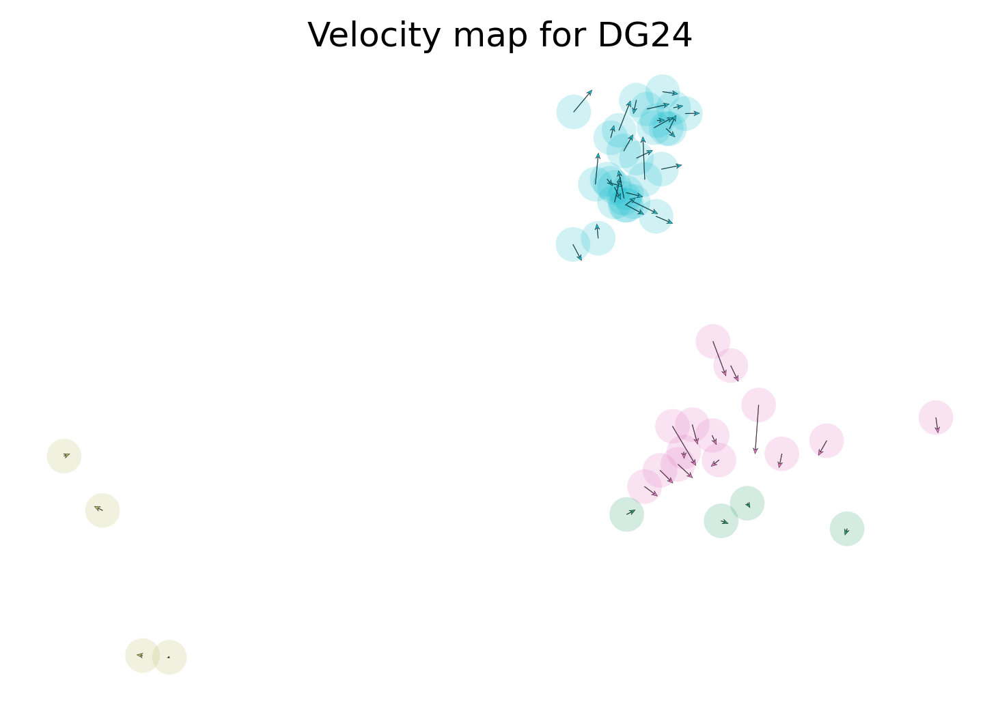

In [124]:
#get one velocity arrow for each individual cell
scv.pl.velocity_embedding(DG24_LA, basis = "umap", color="clusters", title='Velocity map for DG24')

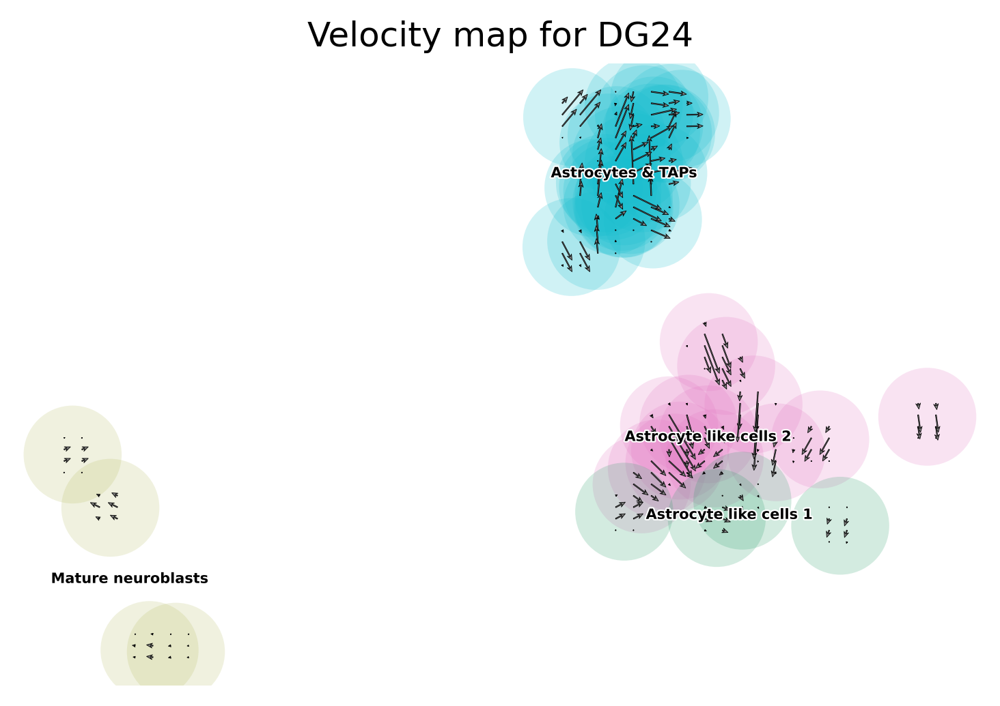

In [125]:
scv.pl.velocity_embedding_grid(DG24_LA, basis = "umap", color="clusters", title='Velocity map for DG24', legend_loc= "on data", legend_fontsize= 5)

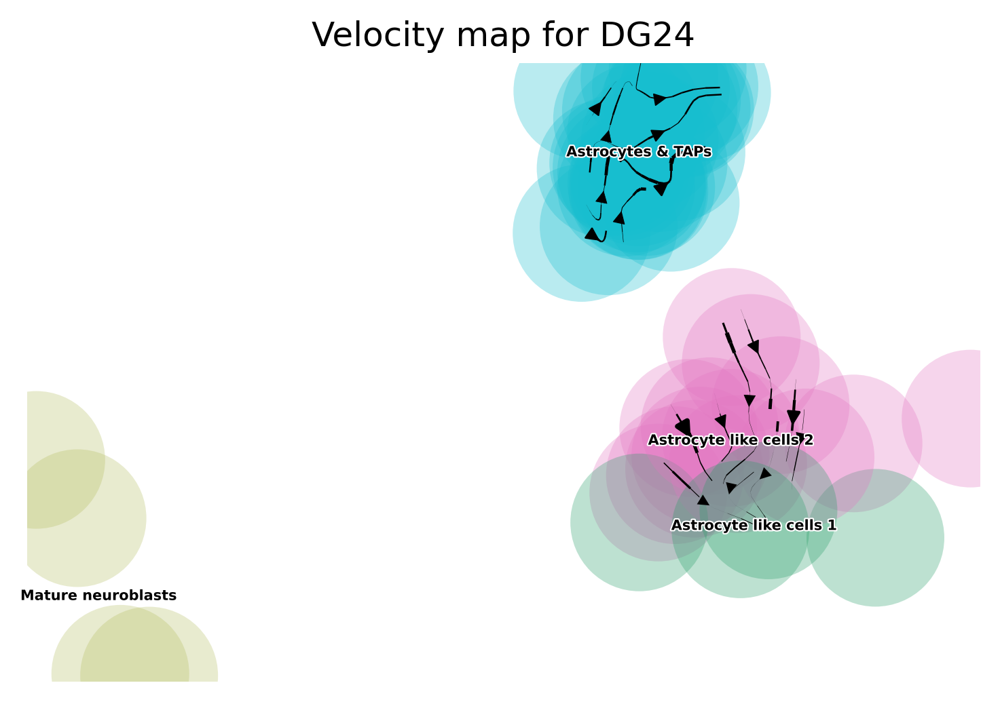

In [126]:
scv.pl.velocity_embedding_stream(DG24_LA, basis = "umap", color="clusters", title='Velocity map for DG24', legend_loc= "on data", legend_fontsize= 5)

In [127]:
DG24_LA

AnnData object with n_obs × n_vars = 51 × 2391
    obs: 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'Sample', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters', 'sample_batch', 'n_counts', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'clusters_colors', 'Sample_colors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'


In [128]:
#calculate  dynamic model
scv.tl.recover_dynamics(DG24_LA, n_jobs= 20)
scv.tl.velocity(DG24_LA, mode= "dynamical")
scv.tl.velocity_graph(DG24_LA)

recovering dynamics (using 20/40 cores)


  0%|          | 0/150 [00:00<?, ?gene/s]

    finished (0:00:11) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/40 cores)


  0%|          | 0/51 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_DG24_dynamic.png


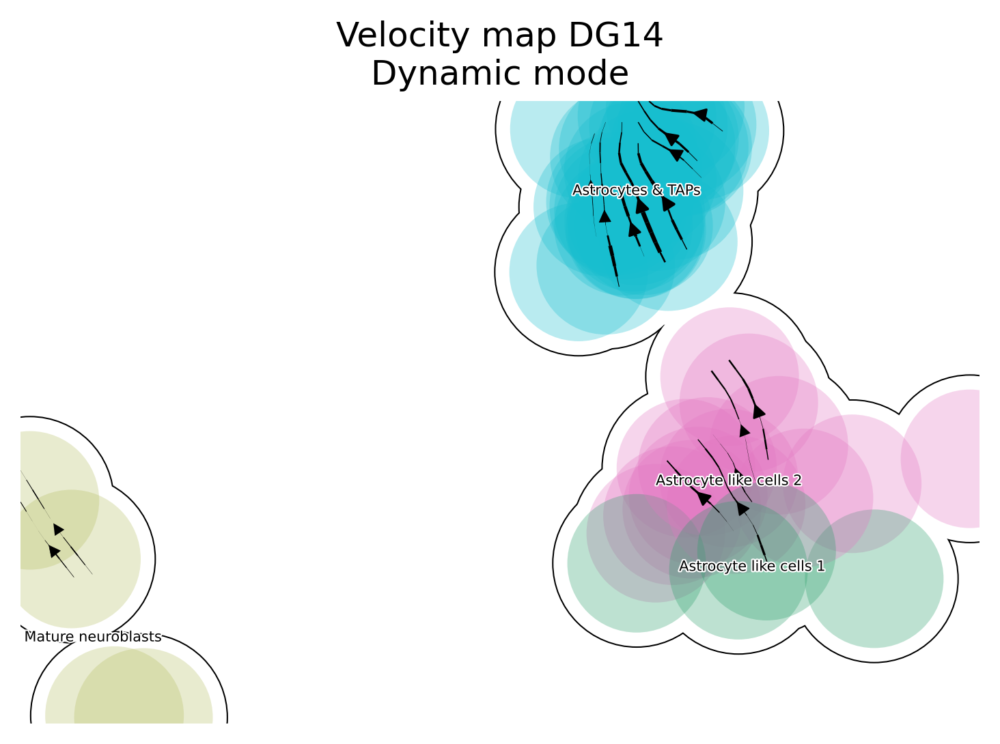

In [129]:
scv.pl.velocity_embedding_stream(DG24_LA, basis= "umap", color= "clusters", title='Velocity map DG14\nDynamic mode', legend_loc='on data',legend_fontoutline=1, legend_fontweight= 'normal',legend_fontsize= 5, 
           add_outline=True, outline_width =(0.01, 0.1), save='DG24_dynamic.png')

computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    60 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    118 total control genes are used. (0:00:00)


calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)
saving figure to file ./figures/scvelo_DG24_CellCycle.png


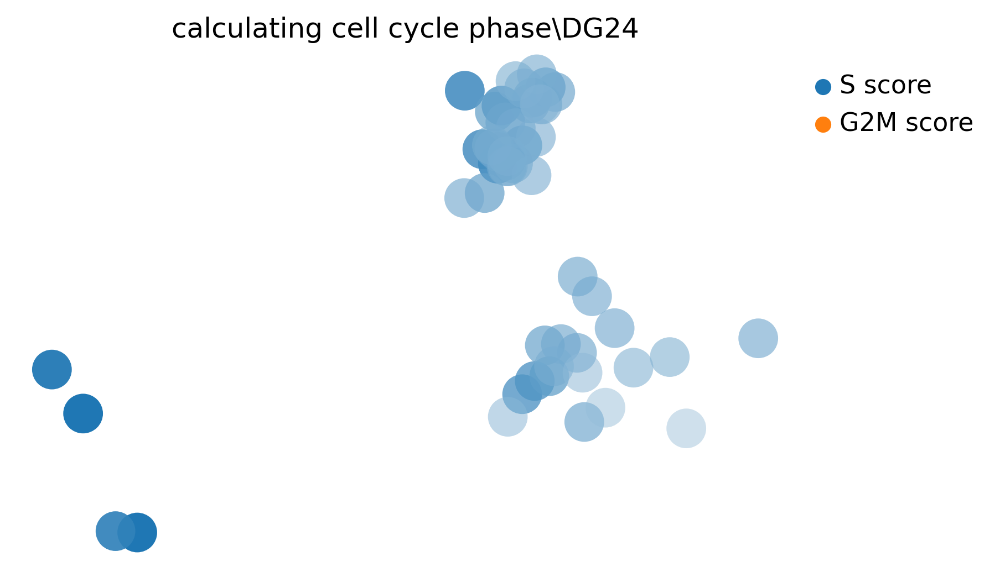

In [130]:
#Calculates scores and assigns a cell cycle phase (G1, S, G2M) using the list of cell cycle genes
scv.tl.score_genes_cell_cycle(DG24_LA)
scv.pl.scatter(DG24_LA, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95], title= "calculating cell cycle phase\DG24", save='DG24_CellCycle.png')

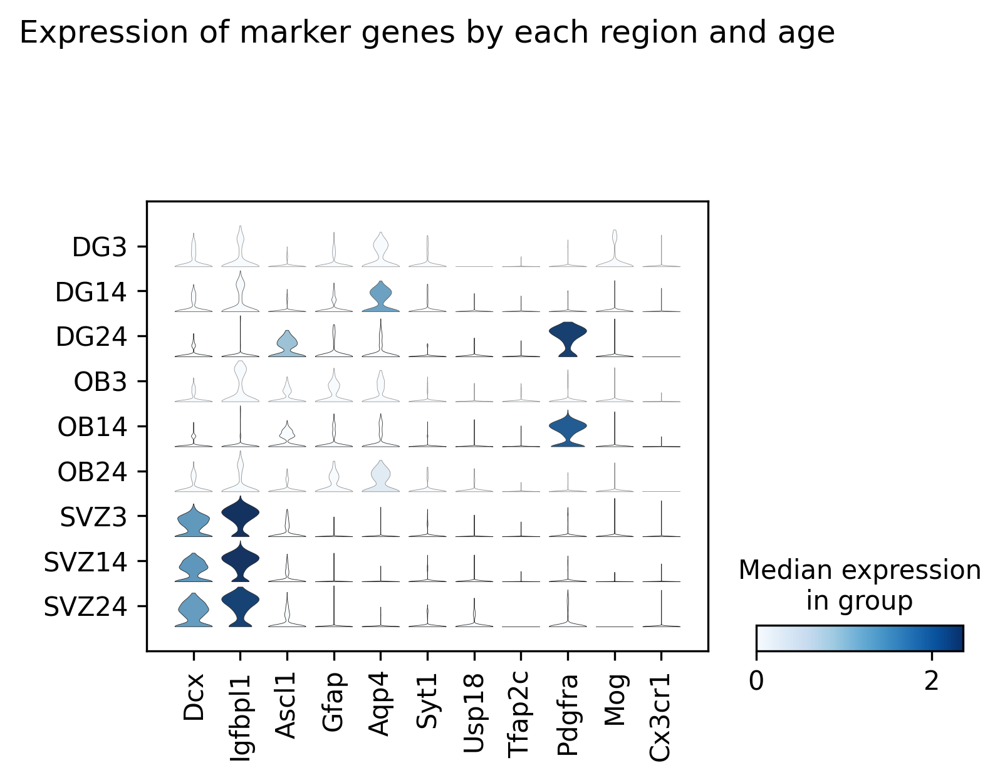

In [131]:
#visualize the marker genes on all dataset in a violin
sc.pl.stacked_violin(adata_all, marker_genes, groupby='Sample', title = "Expression of marker genes by each region and age")

In [132]:
# load loom files (created by velocyto) for spliced/unspliced matrices for each sample all data:
SVZ3_ldata = scv.read('/projects/fs1/mtorbati/Torbati/CellRanger_V6/cellranger_count/SVZ3/SVZ3_count/velocyto/SVZ3_count.loom', cache=True)
OB3_ldata = scv.read('/projects/fs1/mtorbati/Torbati/CellRanger_V6/cellranger_count/OB3/OB3_count/velocyto/OB3_count.loom', cache=True)

... reading from cache file cache/projects-fs1-mtorbati-Torbati-CellRanger_V6-cellranger_count-SVZ3-SVZ3_count-velocyto-SVZ3_count.h5ad
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... reading from cache file cache/projects-fs1-mtorbati-Torbati-CellRanger_V6-cellranger_count-OB3-OB3_count-velocyto-OB3_count.h5ad
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [133]:
SVZ3_ldata.var_names_make_unique()
OB3_ldata.var_names_make_unique()

In [134]:
SVZ3_OB3_ldata = SVZ3_ldata.concatenate([OB3_ldata])

In [135]:
SVZ3_OB3_ldata

AnnData object with n_obs × n_vars = 1758 × 55402
    obs: 'Clusters', '_X', '_Y', 'batch'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [136]:
#merge adata and ldata together make adata --> normalized with RNA includes 'spliced' and 'unspliced' regions
#LA in variable names is for ldata and adata combined
SVZ3_OB3_LA = scv.utils.merge(SVZ3_OB3_ldata, SVZ3_OB3)

In [137]:
SVZ3_OB3_LA

AnnData object with n_obs × n_vars = 1195 × 2391
    obs: 'Clusters', '_X', '_Y', 'batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'sample_batch', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'clusters_colors', 'Sample_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [138]:
#exclude the not relevant clusters
SVZ3_OB3_LA = SVZ3_OB3_LA[~SVZ3_OB3_LA.obs['clusters'].isin(['Mature Oligodendrocytes','OPCs', 'Microglial cells']),:]

saving figure to file ./figures/scvelo_proportions_SVZ3_OB3_S_U.png


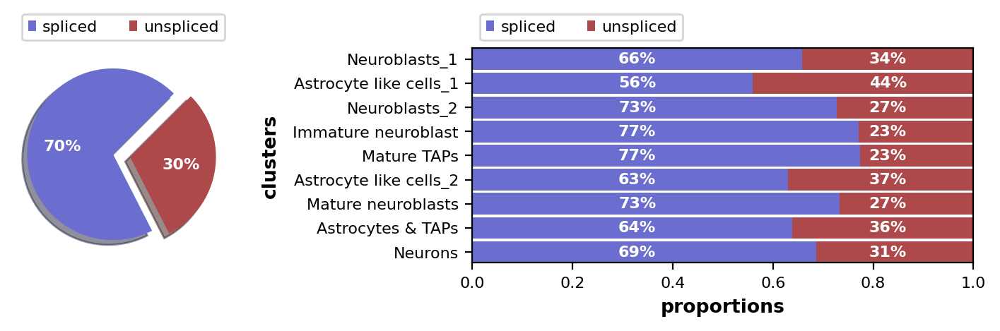

In [139]:
scv.pl.proportions(SVZ3_OB3_LA[~SVZ3_OB3_LA.obs['clusters'].isin(['Mature Oligodendrocytes','OPCs', 'Microglial cells']),:], groupby='clusters',save='SVZ3_OB3_S_U.png')

In [140]:
#calculate the moments
scv.pp.moments(SVZ3_OB3_LA)

Normalized count data: X, spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [141]:
#calculate the velocity with defalt value (stochastic method)
scv.tl.velocity(SVZ3_OB3_LA)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [142]:
#compute the velocity graph
scv.tl.velocity_graph(SVZ3_OB3_LA)

computing velocity graph (using 1/40 cores)


  0%|          | 0/1101 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


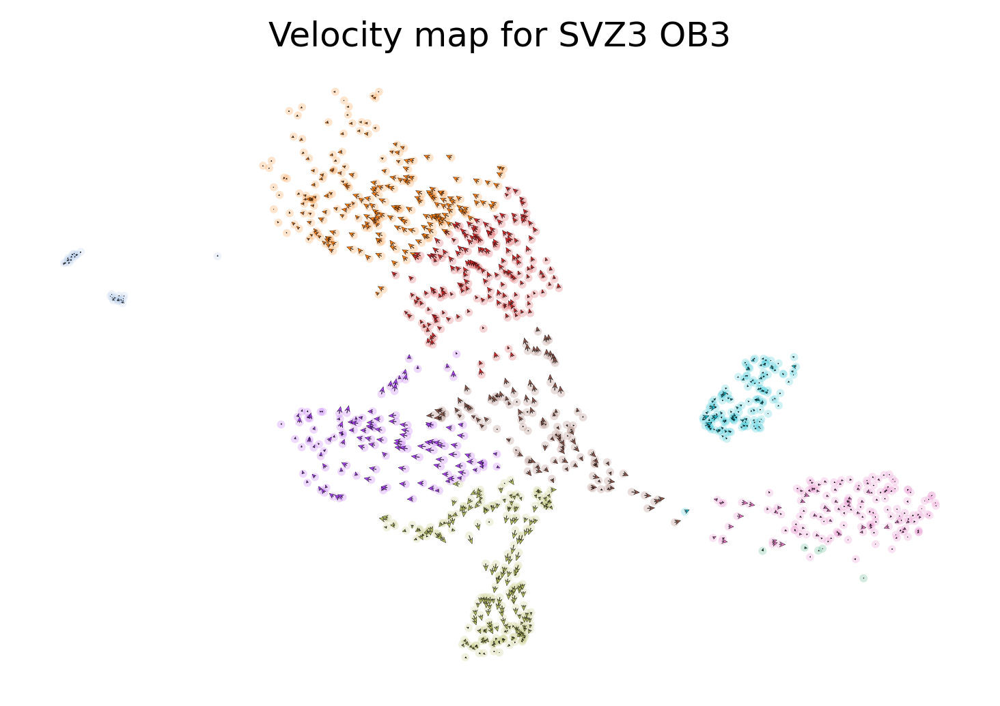

In [143]:
#get one velocity arrow for each individual cell
scv.pl.velocity_embedding(SVZ3_OB3_LA, basis = "umap", color="clusters", title='Velocity map for SVZ3_OB3')

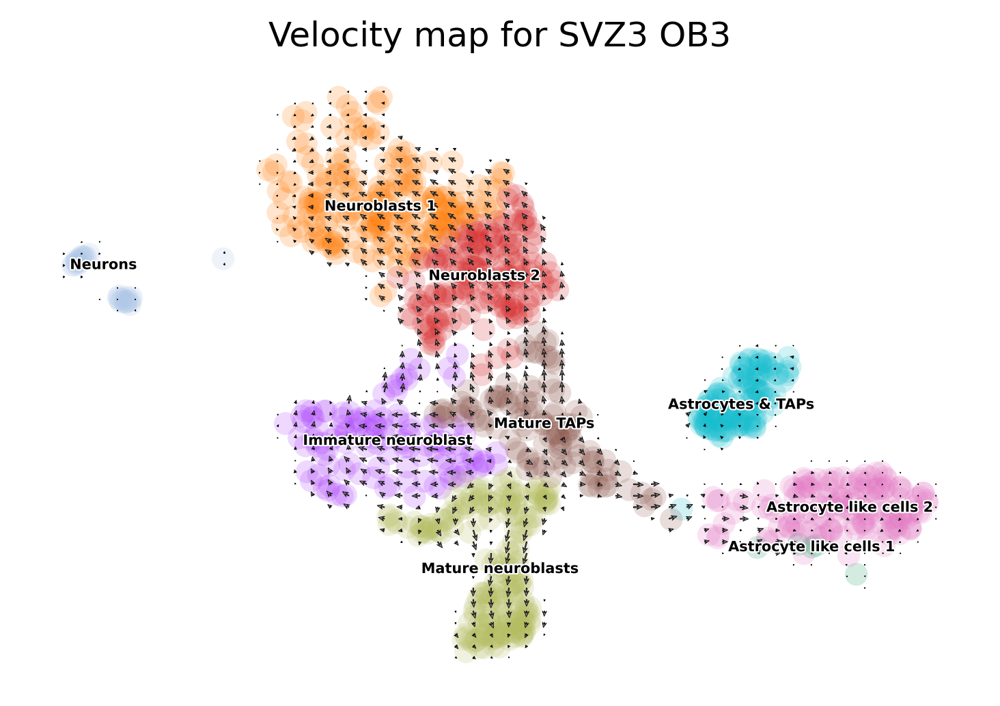

In [144]:
scv.pl.velocity_embedding_grid(SVZ3_OB3_LA, basis = "umap", color="clusters", title='Velocity map for SVZ3_OB3', legend_loc= "on data", legend_fontsize= 5)

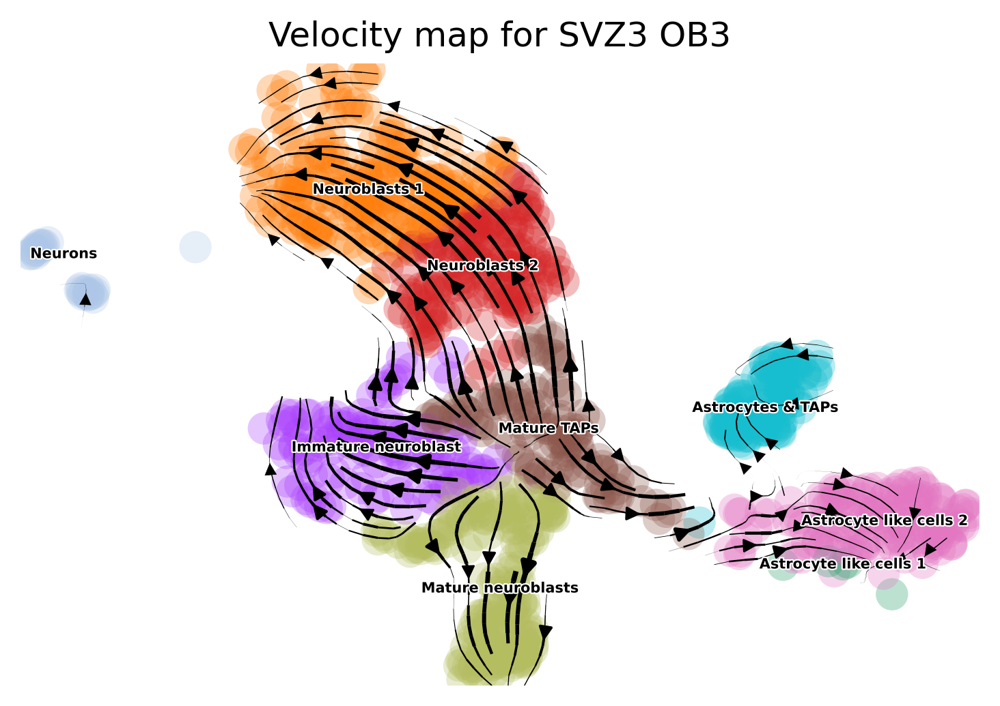

In [145]:
scv.pl.velocity_embedding_stream(SVZ3_OB3_LA, basis = "umap", color="clusters", title='Velocity map for SVZ3_OB3', legend_loc= "on data", legend_fontsize= 5)

In [146]:
SVZ3_OB3_LA

AnnData object with n_obs × n_vars = 1101 × 2391
    obs: 'Clusters', '_X', '_Y', 'batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'sample_batch', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters', 'n_counts', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'clusters_colors', 'Sample_colors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity

In [147]:
#calculate  dynamic model
scv.tl.recover_dynamics(SVZ3_OB3_LA, n_jobs= 20)
scv.tl.velocity(SVZ3_OB3_LA, mode= "dynamical")
scv.tl.velocity_graph(SVZ3_OB3_LA)

recovering dynamics (using 20/40 cores)


  0%|          | 0/905 [00:00<?, ?gene/s]

    finished (0:02:30) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/40 cores)


  0%|          | 0/1101 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_SVZ3_OB3_dynamic.png


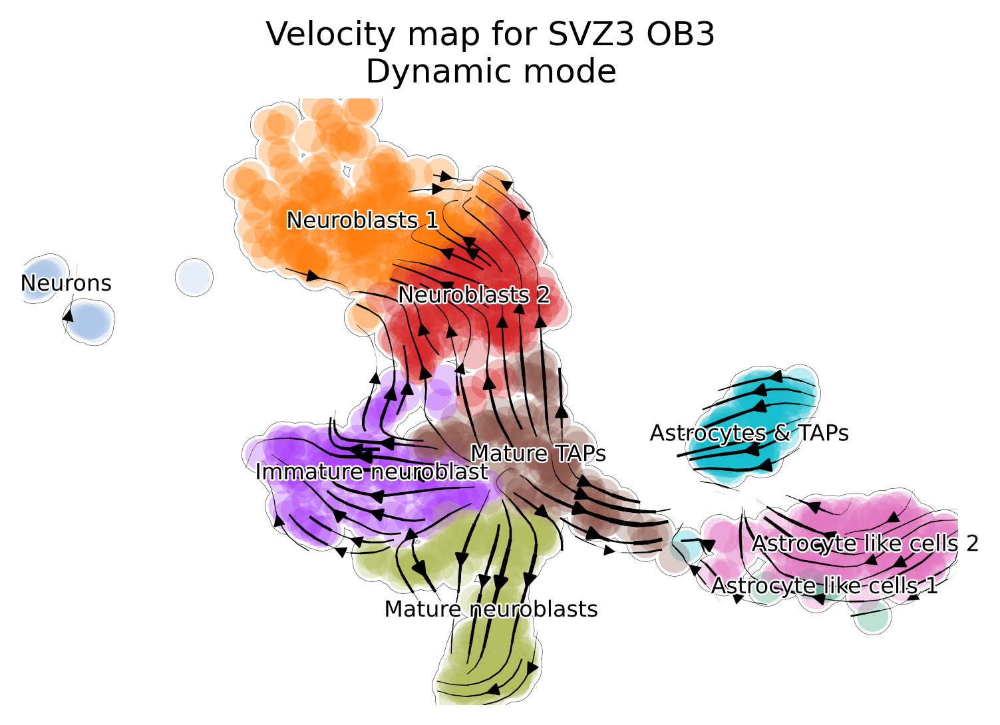

In [148]:
scv.pl.velocity_embedding_stream(SVZ3_OB3_LA, basis= "umap",color= "clusters",  legend_loc='on data',legend_fontoutline=1.2, legend_fontweight= 'normal',legend_fontsize= 8, 
           add_outline=True, outline_width =(0.01, 0.1),title='Velocity map for SVZ3_OB3\nDynamic mode', save='SVZ3_OB3_dynamic.png')

computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    58 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    106 total control genes are used. (0:00:00)


calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)
saving figure to file ./figures/scvelo_SVZ3_OB3_CellCycle.png


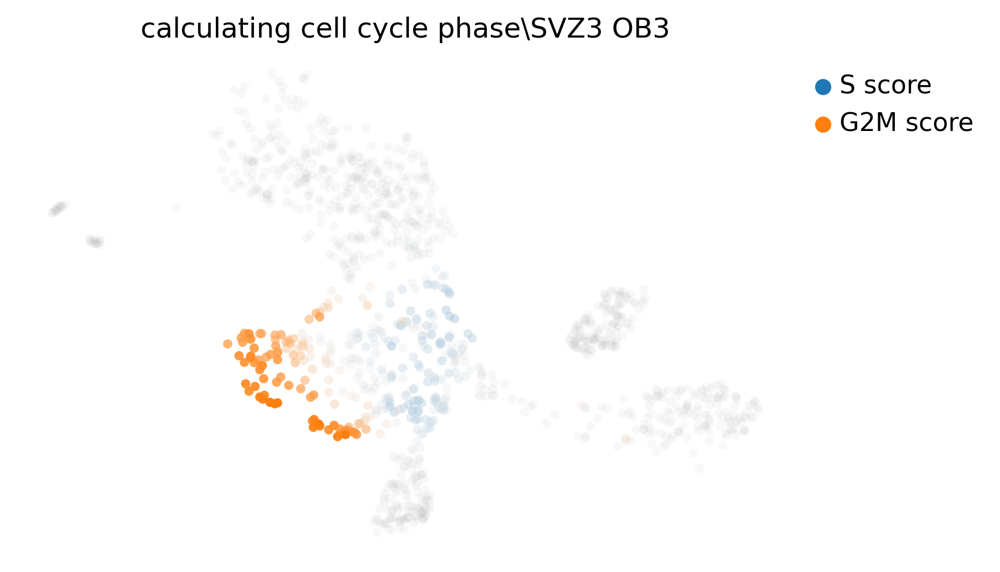

In [149]:
#Calculates scores and assigns a cell cycle phase (G1, S, G2M) using the list of cell cycle genes
scv.tl.score_genes_cell_cycle(SVZ3_OB3_LA)
scv.pl.scatter(SVZ3_OB3_LA, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95], title= "calculating cell cycle phase\SVZ3_OB3",save='SVZ3_OB3_CellCycle.png')

In [150]:
# load loom files (created by velocyto) for spliced/unspliced matrices for each sample all data:
SVZ14_ldata = scv.read('/projects/fs1/mtorbati/Torbati/CellRanger_V6/cellranger_count/SVZ14/SVZ14_count/velocyto/SVZ14_count.loom', cache=True)
OB14_ldata = scv.read('/projects/fs1/mtorbati/Torbati/CellRanger_V6/cellranger_count/OB14/OB14_count/velocyto/OB14_count.loom', cache=True)

... reading from cache file cache/projects-fs1-mtorbati-Torbati-CellRanger_V6-cellranger_count-SVZ14-SVZ14_count-velocyto-SVZ14_count.h5ad
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... reading from cache file cache/projects-fs1-mtorbati-Torbati-CellRanger_V6-cellranger_count-OB14-OB14_count-velocyto-OB14_count.h5ad
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [151]:
SVZ14_ldata.var_names_make_unique()
OB14_ldata.var_names_make_unique()

In [152]:
SVZ14_OB14_ldata = SVZ14_ldata.concatenate([OB14_ldata])

In [153]:
SVZ14_OB14_ldata

AnnData object with n_obs × n_vars = 2247 × 55402
    obs: 'Clusters', '_X', '_Y', 'batch'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [154]:
#merge adata and ldata together make adata --> normalized with RNA includes 'spliced' and 'unspliced' regions
#LA in variable names is for ldata and adata combined
SVZ14_OB14_LA = scv.utils.merge(SVZ14_OB14_ldata, SVZ14_OB14)

In [155]:
SVZ14_OB14_LA

AnnData object with n_obs × n_vars = 1704 × 2391
    obs: 'Clusters', '_X', '_Y', 'batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'sample_batch', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'clusters_colors', 'Sample_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [156]:
SVZ14_OB14_LA = SVZ14_OB14_LA[~SVZ14_OB14_LA.obs['clusters'].isin(['Mature Oligodendrocytes', 'OPCs']),:]

saving figure to file ./figures/scvelo_proportions_SVZ14_OB14_S_U.png


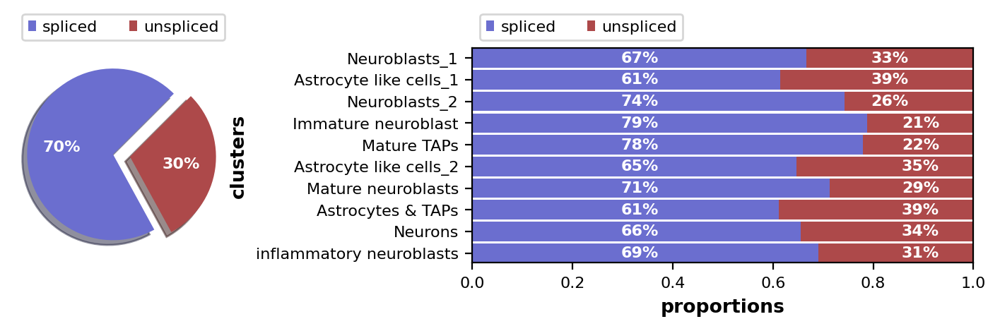

In [157]:
scv.pl.proportions(SVZ14_OB14_LA, groupby='clusters',save='SVZ14_OB14_S_U.png')

In [158]:
#calculate the moments
scv.pp.moments(SVZ14_OB14_LA)

Normalized count data: X, spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [159]:
#calculate the velocity with defalt value (stochastic method)
scv.tl.velocity(SVZ14_OB14_LA)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [160]:
#compute the velocity graph
scv.tl.velocity_graph(SVZ14_OB14_LA)

computing velocity graph (using 1/40 cores)


  0%|          | 0/1020 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


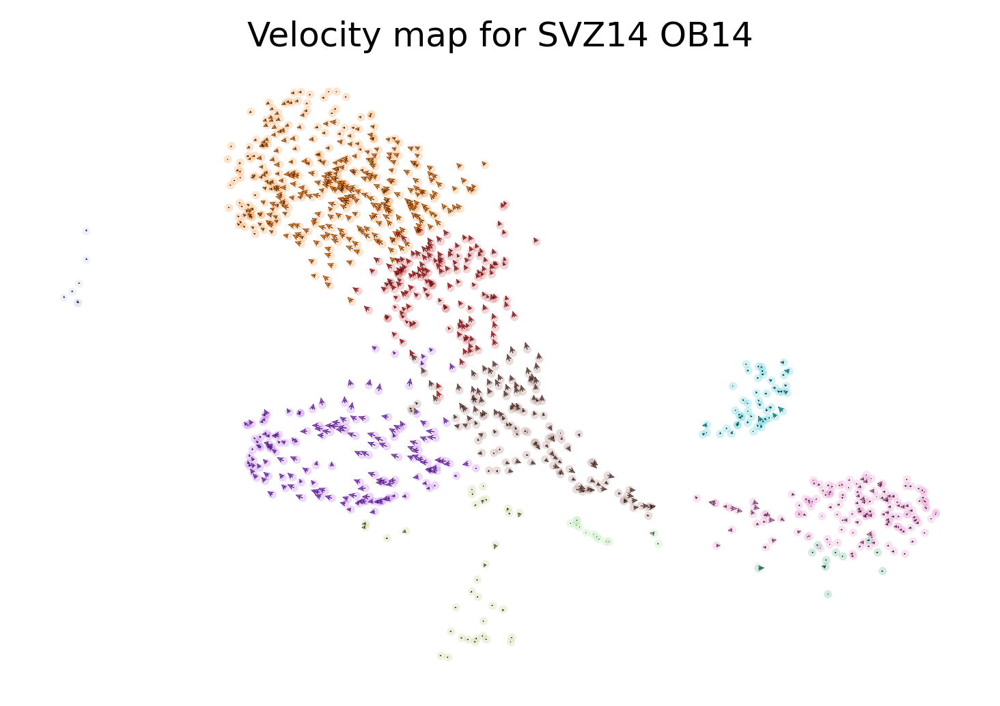

In [161]:
#get one velocity arrow for each individual cell
scv.pl.velocity_embedding(SVZ14_OB14_LA, basis = "umap", color="clusters", title='Velocity map for SVZ14_OB14')

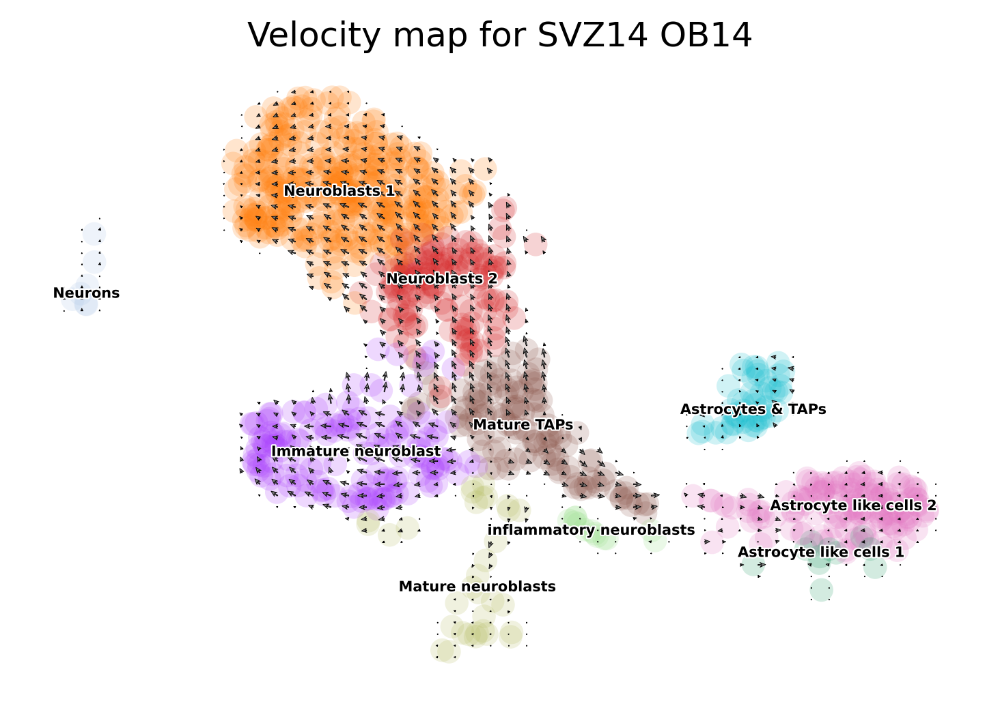

In [162]:
scv.pl.velocity_embedding_grid(SVZ14_OB14_LA, basis = "umap", color="clusters", title='Velocity map for SVZ14_OB14', legend_loc= "on data", legend_fontsize= 5)

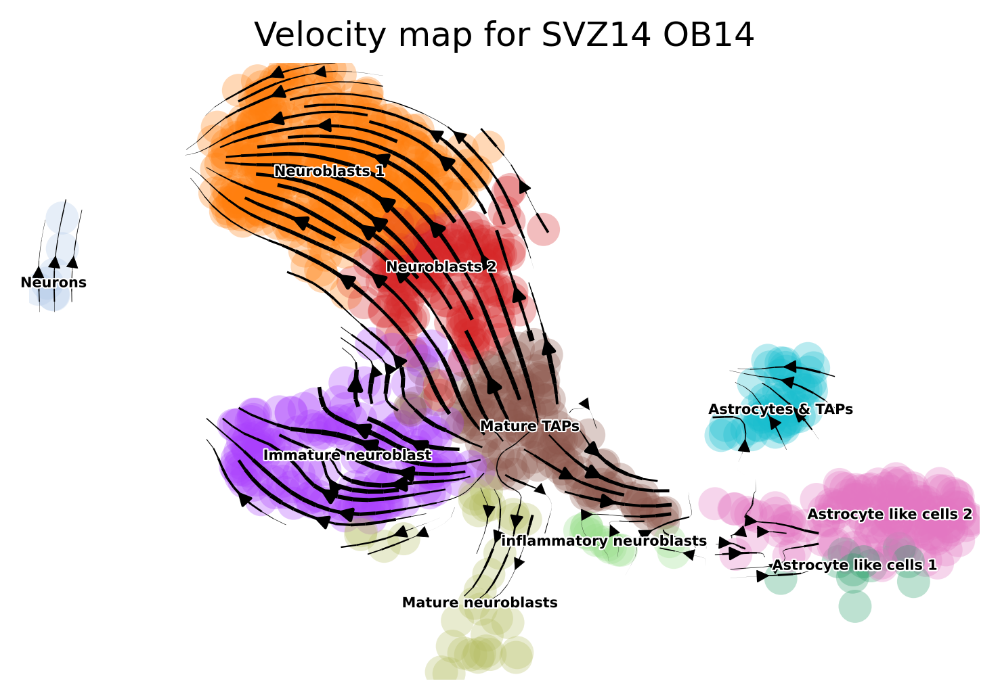

In [163]:
scv.pl.velocity_embedding_stream(SVZ14_OB14_LA, basis = "umap", color="clusters", title='Velocity map for SVZ14_OB14', legend_loc= "on data", legend_fontsize= 5)

In [164]:
SVZ14_OB14_LA

AnnData object with n_obs × n_vars = 1020 × 2391
    obs: 'Clusters', '_X', '_Y', 'batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'sample_batch', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters', 'n_counts', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'clusters_colors', 'Sample_colors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity

In [165]:
#calculate  dynamic model
scv.tl.recover_dynamics(SVZ14_OB14_LA, n_jobs= 20)
scv.tl.velocity(SVZ14_OB14_LA, mode= "dynamical")
scv.tl.velocity_graph(SVZ14_OB14_LA)

recovering dynamics (using 20/40 cores)


  0%|          | 0/842 [00:00<?, ?gene/s]

    finished (0:02:11) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/40 cores)


  0%|          | 0/1020 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_SVZ14_OB14_dynamic.png


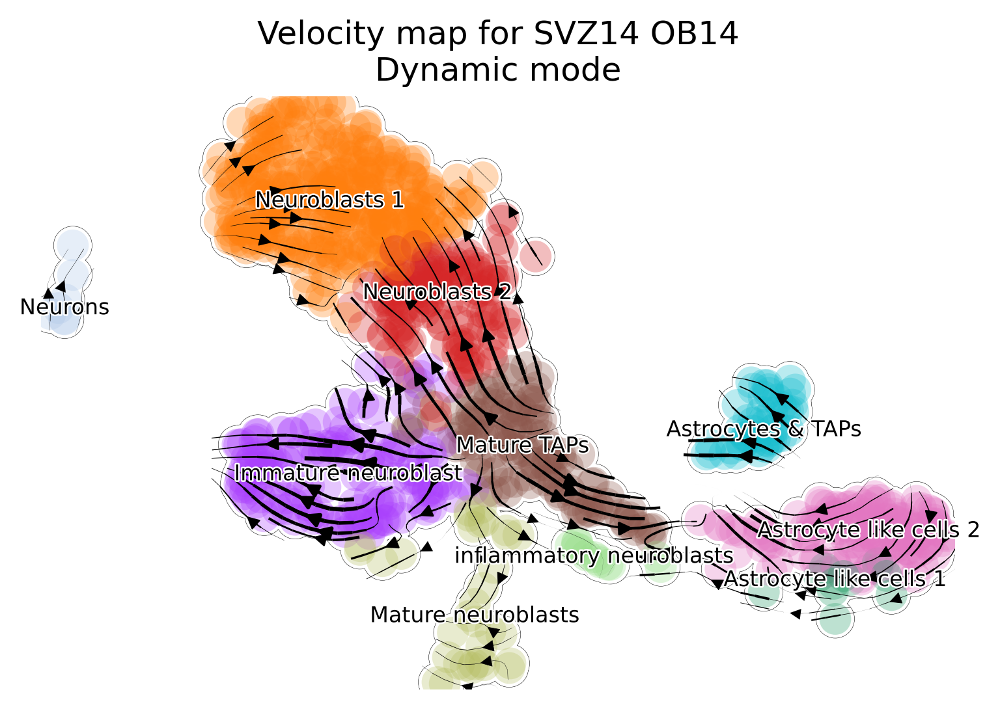

In [166]:
scv.pl.velocity_embedding_stream(SVZ14_OB14_LA, basis= "umap",color= "clusters",  legend_loc='on data',legend_fontoutline=1.2, legend_fontweight= 'normal',legend_fontsize= 8, 
           add_outline=True, outline_width =(0.01, 0.1),title='Velocity map for SVZ14_OB14\nDynamic mode', save='SVZ14_OB14_dynamic.png')

computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    72 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    92 total control genes are used. (0:00:00)


calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)
saving figure to file ./figures/scvelo_SVZ14_OB14_CellCycle.png


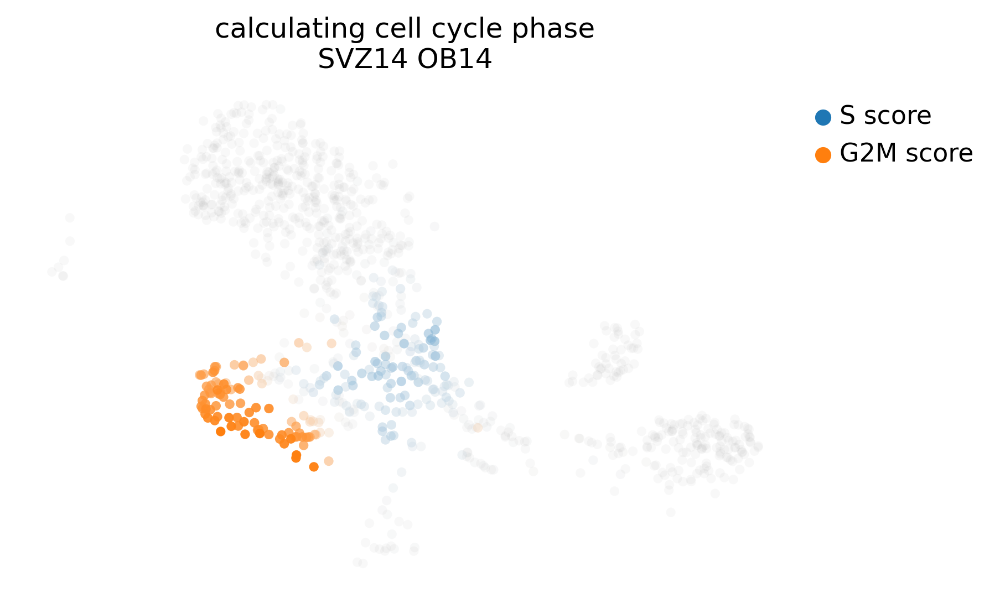

In [167]:
#Calculates scores and assigns a cell cycle phase (G1, S, G2M) using the list of cell cycle genes
scv.tl.score_genes_cell_cycle(SVZ14_OB14_LA)
scv.pl.scatter(SVZ14_OB14_LA, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95], title= "calculating cell cycle phase\nSVZ14_OB14", save='SVZ14_OB14_CellCycle.png')

In [168]:
# load loom files (created by velocyto) for spliced/unspliced matrices for each sample all data:
SVZ24_ldata = scv.read('/projects/fs1/mtorbati/Torbati/CellRanger_V6/cellranger_count/SVZ24/SVZ24_count/velocyto/SVZ24_count.loom', cache=True)
OB24_ldata = scv.read('/projects/fs1/mtorbati/Torbati/CellRanger_V6/cellranger_count/OB24/OB24_count/velocyto/OB24_count.loom', cache=True)

... reading from cache file cache/projects-fs1-mtorbati-Torbati-CellRanger_V6-cellranger_count-SVZ24-SVZ24_count-velocyto-SVZ24_count.h5ad
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... reading from cache file cache/projects-fs1-mtorbati-Torbati-CellRanger_V6-cellranger_count-OB24-OB24_count-velocyto-OB24_count.h5ad
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [169]:
SVZ24_ldata.var_names_make_unique()
OB24_ldata.var_names_make_unique()

In [170]:
SVZ24_OB24_ldata = SVZ24_ldata.concatenate([OB24_ldata])

In [171]:
SVZ24_OB24_ldata

AnnData object with n_obs × n_vars = 1360 × 55402
    obs: 'Clusters', '_X', '_Y', 'batch'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [172]:
#merge adata and ldata together make adata --> normalized with RNA includes 'spliced' and 'unspliced' regions
#LA in variable names is for ldata and adata combined
SVZ24_OB24_LA = scv.utils.merge(SVZ24_OB24_ldata, SVZ24_OB24)

In [173]:
SVZ24_OB24_LA

AnnData object with n_obs × n_vars = 784 × 2391
    obs: 'Clusters', '_X', '_Y', 'batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'sample_batch', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'clusters_colors', 'Sample_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [174]:
SVZ24_OB24_LA = SVZ24_OB24_LA[~SVZ24_OB24_LA.obs['clusters'].isin(['Mature Oligodendrocytes','Microglial cells', 'OPCs']),:]

saving figure to file ./figures/scvelo_proportions_SVZ24_OB24_S_U.png


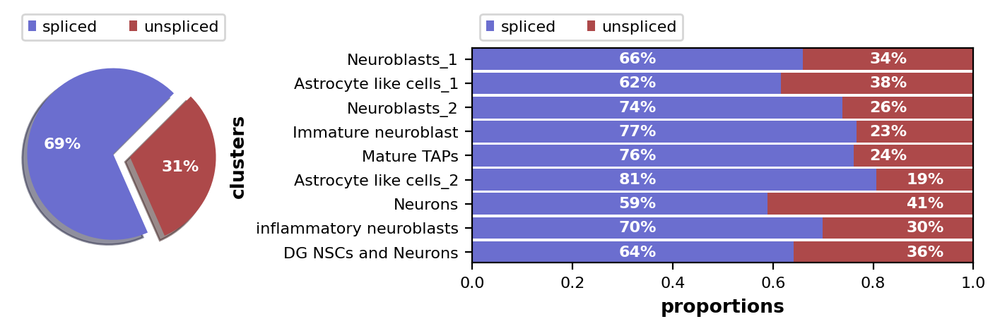

In [175]:
scv.pl.proportions(SVZ24_OB24_LA, groupby='clusters',save='SVZ24_OB24_S_U.png')

In [176]:
#calculate the moments
scv.pp.moments(SVZ24_OB24_LA)

Normalized count data: X, spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [177]:
#calculate the velocity with defalt value (stochastic method)
scv.tl.velocity(SVZ24_OB24_LA)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [178]:
#compute the velocity graph
scv.tl.velocity_graph(SVZ24_OB24_LA)

computing velocity graph (using 1/40 cores)


  0%|          | 0/717 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


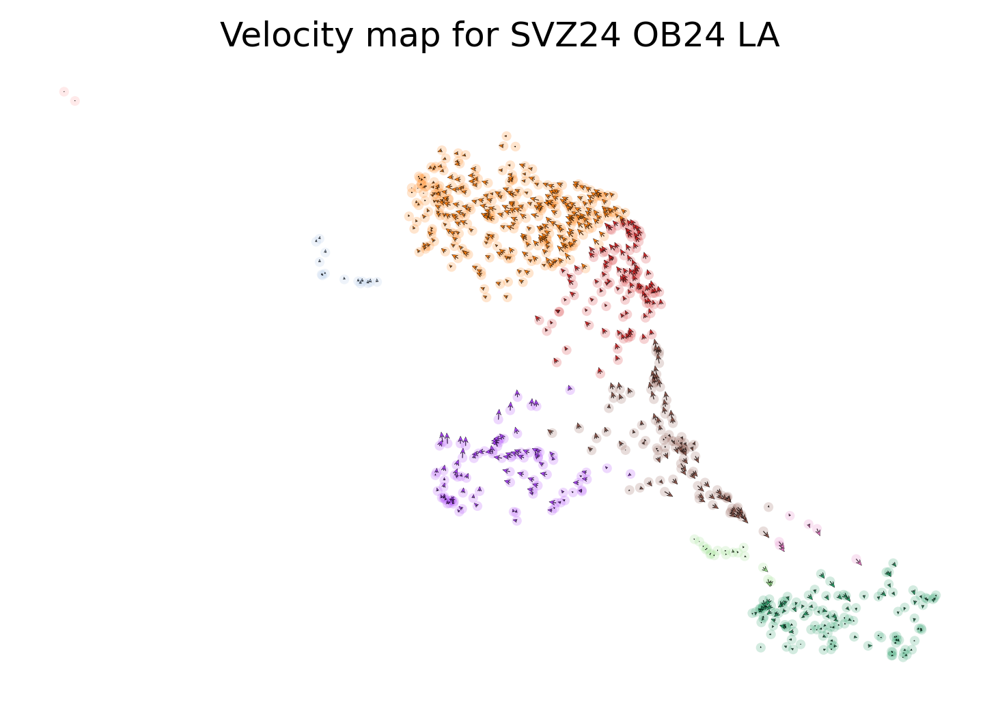

In [179]:
#get one velocity arrow for each individual cell
scv.pl.velocity_embedding(SVZ24_OB24_LA, basis = "umap", color="clusters", title='Velocity map for SVZ24_OB24_LA')

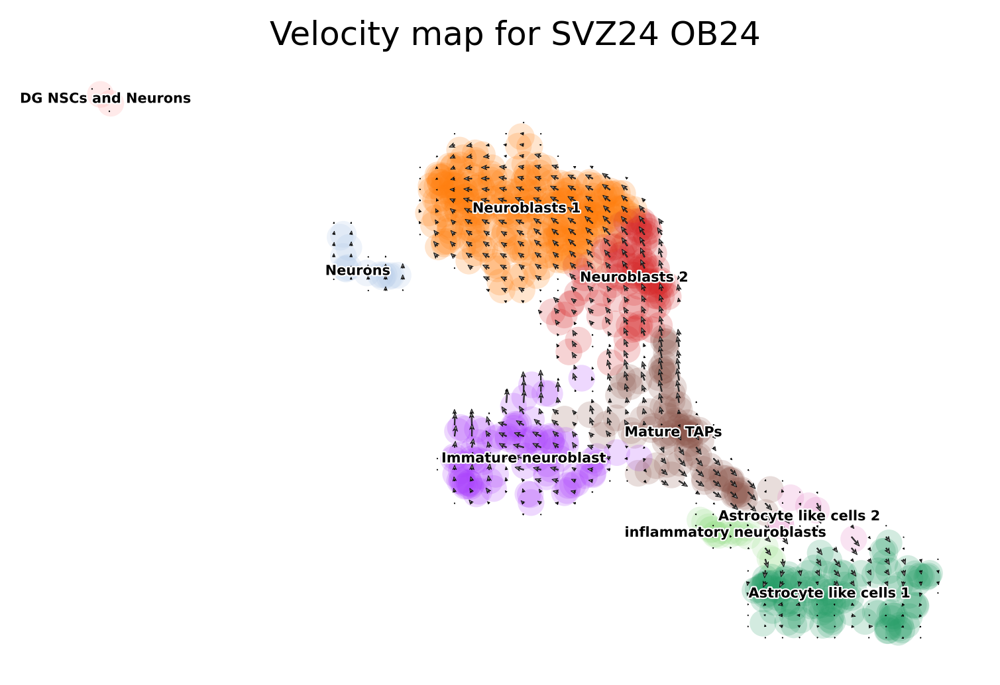

In [180]:
scv.pl.velocity_embedding_grid(SVZ24_OB24_LA, basis = "umap", color="clusters", title='Velocity map for SVZ24_OB24', legend_loc= "on data", legend_fontsize= 5)

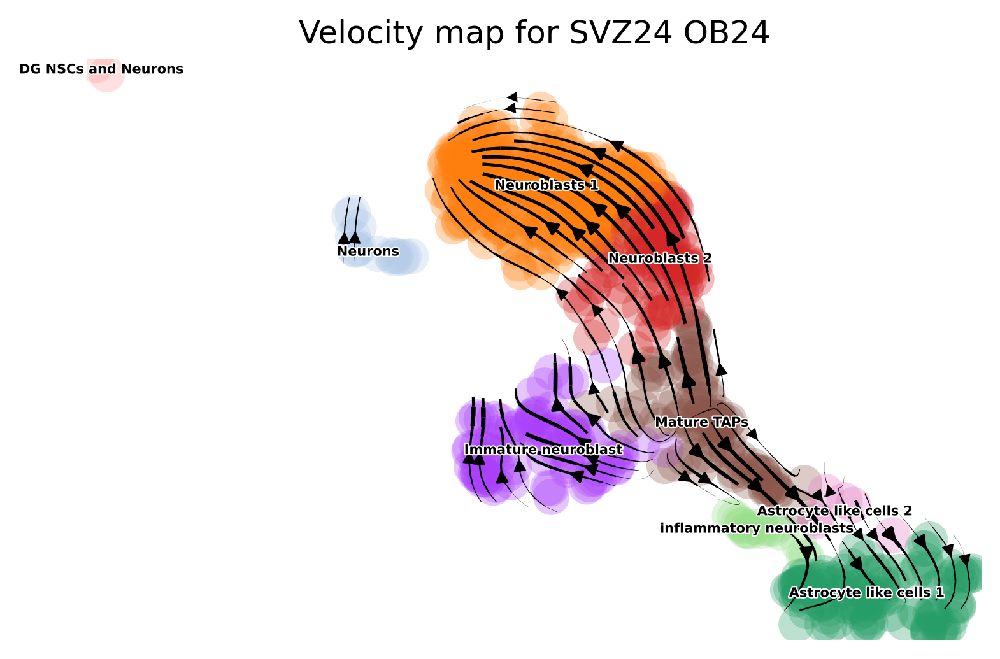

In [181]:
scv.pl.velocity_embedding_stream(SVZ24_OB24_LA, basis = "umap", color="clusters", title='Velocity map for SVZ24_OB24', legend_loc= "on data", legend_fontsize= 5)

In [182]:
SVZ24_OB24_LA

AnnData object with n_obs × n_vars = 717 × 2391
    obs: 'Clusters', '_X', '_Y', 'batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'sample_batch', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters', 'n_counts', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'clusters_colors', 'Sample_colors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'

In [183]:
#calculate  dynamic model
scv.tl.recover_dynamics(SVZ24_OB24_LA, n_jobs= 20)
scv.tl.velocity(SVZ24_OB24_LA, mode= "dynamical")
scv.tl.velocity_graph(SVZ24_OB24_LA)

recovering dynamics (using 20/40 cores)


  0%|          | 0/841 [00:00<?, ?gene/s]

    finished (0:01:54) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/40 cores)


  0%|          | 0/717 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_SVZ24_OB24_dynamic.png


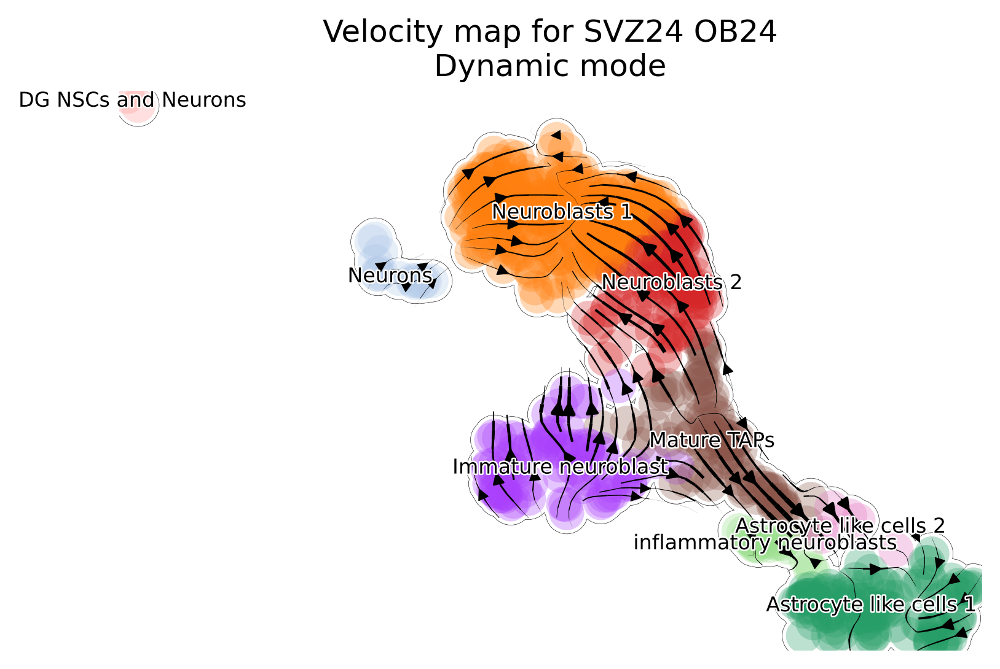

In [184]:
scv.pl.velocity_embedding_stream(SVZ24_OB24_LA, basis= "umap",color= "clusters",  legend_loc='on data',legend_fontoutline=1.2, legend_fontweight= 'normal',legend_fontsize= 8, 
           add_outline=True, outline_width =(0.01, 0.1),title='Velocity map for SVZ24_OB24\nDynamic mode', save='SVZ24_OB24_dynamic.png')

computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    83 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    102 total control genes are used. (0:00:00)


calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)
saving figure to file ./figures/scvelo_SVZ24_OB24_CellCycle.png


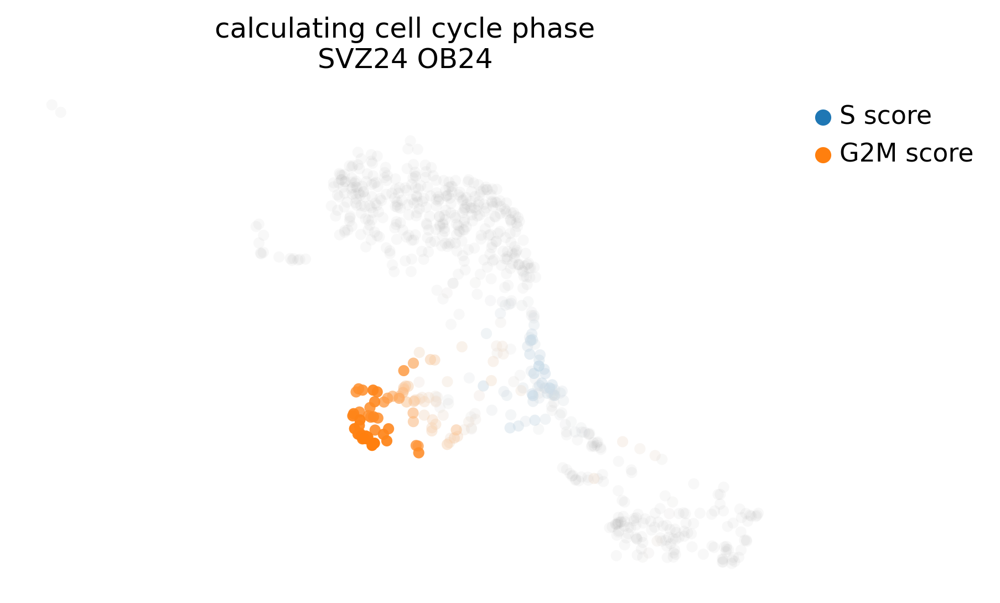

In [185]:
#Calculates scores and assigns a cell cycle phase (G1, S, G2M) using the list of cell cycle genes
scv.tl.score_genes_cell_cycle(SVZ24_OB24_LA)
scv.pl.scatter(SVZ24_OB24_LA, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95], title= "calculating cell cycle phase\nSVZ24_OB24", save='SVZ24_OB24_CellCycle.png')

In [186]:
end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))

Duration: 0:12:31.132382
